# SENTIMENT ANALYSIS OF RESPONSES FROM BENEFICIARIES TO LIVELIHOOD SUBPROJECTS IN ZAMBIA
**Author:** Nathan Namatama  
**Institution:** Leibniz Institute of Ecological Urban and Regional Development and Technical University of Dresden  
**Year:** 2024  
**Related Publication:** The effects and impacts of livelihood activities and unplanned human settlement growth on greenspace and wetland landscapes in Zambia: *A case of the three areas of the Pilot Programme for Climate Resilience (PPCR)*  

## Purpose of the Analysis
The analysis is conducted on the data collection that was conducted in Zambia from 23rd July 2024 to 22nd September 2024. The primary data was collected using ArcGIS Survey123 application in an offline mode mostly in certain areas that did not have access to internet while those that ahd internet an online mode was used. The respondents were interviewed using a semi structured question and the responses were recorede in the application as they were responding to the questions.

The analysis is done in the framework of _systems thinking_ of looking at _deep leverage points_ in the **_governance for transformation_** of Social Ecologocal Systems so as to attain sustainable transfomation. The analysis is done in both qualitative and quantitatives (descriptions) to produce graphs and tables that are visualised within the jupyterlab notebook.

##  Table of Contents

1. <a href="#1.-Importing-Libraries">Importing Libraries</a>
2. <a href="#2.-Reading-the-Excel-Table">Reading the Excel Table</a>
3. <a href="#3.-Missing-values">Missing values</a>
4. <a href="#4.-Deleting-Columnns">Deleting Columnns</a>
5. <a href="#5.-Renaming-Columns">Renaming Columns</a> 
6. <a href="#6.-Selection-of-Likert-Scale-Columns">Selection of Likert Scale Columns</a>
7. <a href="#7.-The-Number-of-Responses">The Number of Responses</a>
8. <a href="#8.-Defined-or-Responses-with-Choices">Defined or Responses with Choices</a>
9. <a href="#9.-Description-Statistics">Description Statistics</a>
10. <a href="#10.-Reasons">Reasons</a>
11. <a href="#11.-Specific-Variables">Specific Variables</a>
12. <a href="#12.-Converting-the-Notebook">Converting the Notebook</a>

## 1. Importing Libraries 
   The liberarries that are needed for conducting the analysis are installed and downloaded. They are as follows:
- **_NLTK:_** For reading text and understanding it in a way that a human can do it
- **_Re:_** For text manipulation and pattern matching
- **_Pandas:_** For converting tables into a format understandable by the computer as well as visualisation
- **_Numpy:_** For conducting statistical culculations
- **_Matplotlib:_** For visualisation
- **_Seabron:_** For visualisation
- **_Io:_** For reading/writing binary and text data efficiently
- **_Csv:_** For reading the csv files
- **_Unicodeddata:_** For interacting with and analyzing Unicode characters
- **_String:_** For language analysis, user input, or file processing
- **_Plotly:_** For visualisation
- **_Plot_Likert:_** For visualisation of likert scales
- **_%matplotlib line:_** For visualisation within the jupyterlab notebook
- **_Nbconvert:_** For converting to HTML format
- **_WordCloud:_** For creating a word cloud

In [166]:
import nltk
import re
from collections import Counter
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize
from nltk import sent_tokenize, word_tokenize, pos_tag
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import io
from io import StringIO
import csv
import unicodedata
import string
import plotly
import plotly.express as px
import plot_likert
from sklearn.model_selection import train_test_split
%matplotlib inline
import nbconvert
from nbconvert import HTMLExporter
import nbformat
from wordcloud import WordCloud

In [167]:
nltk.download('punkt_tab')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\nazin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\nazin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nazin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\nazin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## 2. Reading the Excel Table
   The csv file is converted to a padas dataframe  
   The dataframe table is displyed with **ALL** columns and rows with cutting any

In [168]:
df = pd.read_csv(r"D:\DataAnalysis\Social_Survey_Questionnaire_for_Beneficiaries_0.csv")
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)  
pd.set_option('display.max_columns', None) 

In [169]:
type(df)

pandas.core.frame.DataFrame

In [170]:
df

,ObjectID,GlobalID,Logo_TUDresden,Logo_IOER,Name of Researcher: Nathan Namatama,Email: n.namatama@ioer.de,Logo,The social survey questionnaire is meant to gather information on three things:,•\t How social and ecological systems are managed: This includes understanding how communities and natural environments are governed.,"•\t How people's livelihood activities change the landscape: This looks at how different livelihoods impact the land, environment as well as the land use land cover change.",•\t How nature-based solutions are put into practice: This explores how solutions that use natural processes and resources are implemented to address environmental and social issues.,1. Do you agree to take part in the above study?,2. Do you know that your participation is voluntary and you are free to withdraw anytime?,3. Do you give permission to the data that emerges to be used by the researchers only in an anonymised form?,5. Date,6. Ward Name,7. Sub Project Name,8. Type of Livelihood,9. Size (Lima),12. Name of main project,13. Do you represent other beneficiaries?,14. How many beneficiaries do you represent?,"15. Do you think that there is trust/collaboration among the group members in the management of Forests, Wetlands, National Game Parks and Biodiversity?",16. What reasons can you give for your answer above?,"17. Do you think you would be able to self-organise for management of Forests, Wetlands, National Game Parks and Biodiversity in future?",18. What reasons can you give for your answer above?,"19. Do you think the institutional structures for managing Forests, Wetlands, National Game Parks and Biodiversity need to change?",20. What reasons can you give for your answer above?,"21. Who resolves a conflicts when it arises as you manage Forests, Wetlands, National Game Parks and Biodiversity?","22. Are there 'Champions' from where you can seek advice or that act as role models for management of Forests, Wetlands, National Game Parks and Biodiversity?",23. What reasons can you give for your answer above?,"24. Do you think you can easily accept new knowledge and discard old knowledge on how to manage Forests, Wetlands, National Game Parks and Biodiversity?",25. What reasons can you give for your answer above?,"26. Have you received any kind of training on the management of Forests, Wetlands, National Game Parks and Biodiversity?",27. What reasons can you give for your answer above?,"28. Are there national policies that contradicts with the local rules (norms and values) on management of Forests, Wetlands, National Game Parks and Biodiversity?",29. What reasons can you give for your answer above?,"30. Do you think you can easily accept new laws for the management of Forests, Wetlands, National Game Parks and Biodiversity?",31. What reasons can you give for your answer above?,"32. Do you have the ability to interpret information from various sources for management of Forests, Wetlands, National Game Parks and Biodiversity?",33. What reasons can you give for your answer above?,34. What is your project about?,"35. What values do you express when managing natural resources such as Forests, Wetlands, National Game Parks and Biodiversity?","36. Do you think your values can be changed in regards to managing nature such as Forests, Wetlands, National Game Parks and Biodiversity?",37. What reasons can you give for your answer above?,"38. Do you think there are cultural aspects included in the management of Forests, Wetlands, National Game Parks and Biodiversity?",39. What reasons can you give for your answer above?,"40. Do you think your views and beliefs are valued in the management of Forests, Wetlands, National Game Parks and Biodiversity?",41. What reasons can you give for your answer above?,"42. What are some of the norms in the management of Forests, Wetlands, National Game Parks and Biodiversity?",43. Do you think the above mentioned norms can be changed?,44. What reasons can you give for your answer above?,"45. Are there cultural p

In [171]:
df.shape

(150, 120)

## 3. Missing values
   The Pandas Dataframe is checked for mising values

In [172]:
df.isnull().sum()

ObjectID                                                                                                                                                                                    0
GlobalID                                                                                                                                                                                    0
Logo_TUDresden                                                                                                                                                                            150
Logo_IOER                                                                                                                                                                                 150
Name of Researcher: Nathan Namatama                                                                                                                                                       150
Email: n.namatama@ioer.de                         

### 3.1 Dropping all the Missing Values

In [173]:
df.isnull().sum().sort_values(ascending=False)

Logo_IOER                                                                                                                                                                                 150
Logo_TUDresden                                                                                                                                                                            150
Email: n.namatama@ioer.de                                                                                                                                                                 150
Name of Researcher: Nathan Namatama                                                                                                                                                       150
Logo                                                                                                                                                                                      150
The social survey questionnaire is meant to gather

In [174]:
#df.dropna(inplace=True)

## 4. Deleting Columnns
   There are 120 columns and 85 columns were removed from the pandas dataframe so as to focus on specific columns that have questtions in regards to livelihood and landscape transfromation

In [175]:
df1=df.drop(df.columns[[1,2,3,4,5,6,7,8,9,10,11,12,13,14,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,116,117,118,119]], axis = 1)

In [176]:
df1

,ObjectID,6. Ward Name,7. Sub Project Name,8. Type of Livelihood,9. Size (Lima),12. Name of main project,13. Do you represent other beneficiaries?,14. How many beneficiaries do you represent?,"45. Are there cultural practices that hinder the sustainable management of Forests, Wetlands, National Game Parks and Biodiversity?",46. What reasons can you give for your answer above?,47. Do you think some cultural practices can be changed?,48. Do you consider cultural aspects when formulating the livelihood projects?,49. What reasons can you give for your answer above?,"50. What is the main purpose of landscapes (Forests, Water Bodies, Wetlands… etc.) in your livelihood?",51. Do you think there is need to measure indicators when managing landscapes?,52. How is your connection to nature like?,53. What reasons can you give for your answer above?,54. How long have you worked on this livelihood project?,55. Does your livelihood depend on the natural resources for a living?,56. Do you consider changing your livelihood strategy in future?,57. Do you think it is easier to change your livelihood practices?,58. Are you able to give reasons for your answer above in your ability to change your livelihood practices?,59. Have the ecosystem services reduced from the inception of the project in your ward?,60. Has the deforestation increased in the ward?,61. Do you think protected areas are a hindrance to your livelihoods?,62. Are there new livelihood projects that you think of that have never been implemented?,63. Do you think the livelihood subprojects are contributing to the sustainability of landscapes?,64. Which livelihood is a major contributor to landscape transformation?,65. What reasons can you give for your answer above?,66. Which type of landscape do you depend on much for a livelihood?,67. What reasons can you give for your answer above?,Specify:.4,Specify:.5,Specify:.6,Specify:.7
0,1,Isamba ward,Isamba coperatives,Goat rearing,8to12Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many,Disagree_Likert,It has never happed before in his life time,Undecided_Likert,Strongly_Disagree_Likert,There is no cultural history in the area,Nature_Protection_Purpose,Strongly_Agree_Likert,"Psychological_Connection,Material_Connection",The animals can be used by the future generation as well,3to4Years_Long,Strongly_Disagree_Likert,Agree_Likert,Strongly_Agree_Likert,If the SES are taken care of they can increase in number and bring income,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Wood_Extraction,The trees have been depleted and it has caused reduced rainfall,Agriculture_Areas_Dependent,He cultivates a large area of land so that some crops can be sold for a livelihood,NaN,NaN,NaN,NaN
1,2,Isamba ward,Misenga cooperative multipurpose society,"Goat rearing, Gardening, Fruit trees",Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many,Strongly_Agree_Likert,There is need to harvest trees when they have fully grown the same applies to biodiversity,Strongly_Agree_Likert,Strongly_Agree_Likert,There is need to have power in what is being formulated so that there is ownership,Nature_Protection_Purpose,Strongly_Agree_Likert,"Philosophical_Connection,Psychological_Connection",How the animals can be used as an example on how people should lead their life,Greaterthan9Years_Long,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,The SeS can be depleted thus there need to change to agriculture like goat rearing,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Land_Agriculture,Because i have to clear the land for agriculture to plant crops hence the landscape change,Wetlands_Dependent,The catching of fish is the source of income in this area,NaN,NaN,NaN,NaN
2,3,Isamba ward,Ninge Cooperative,"Goat Rearing, Agricuture-cassava",Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many,Strongly_Disagree_Likert,Ther

## 5. Renaming Columns
   The headings of the columns were renamed for easy inclusion in the code

In [177]:
df1.columns

Index(['ObjectID', '6. Ward Name', '7. Sub Project Name',
       '8. Type of Livelihood', '9. Size (Lima)', '12. Name of main project',
       '13. Do you represent other beneficiaries?',
       '14. How many beneficiaries do you represent?',
       '45. Are there cultural practices that hinder the sustainable management of Forests, Wetlands, National Game Parks and Biodiversity?',
       '46. What reasons can you give for your answer above?',
       '47. Do you think some cultural practices can be changed?',
       '48. Do you consider cultural aspects when formulating the livelihood projects?',
       '49. What reasons can you give for your answer above?',
       '50. What is the main purpose of landscapes (Forests, Water Bodies, Wetlands… etc.) in your livelihood?',
       '51. Do you think there is need to measure indicators when managing landscapes?',
       '52. How is your connection to nature like?',
       '53. What reasons can you give for your answer above?',
       '54. How

In [178]:
df2=df1.rename(columns= {'1. Do you agree to take part in the above study?': 'Part_study',
                        '2. Do you know that your participation is voluntary and you are free to withdraw anytime?':'Participation_Voluntary', 
                        '3. Do you give permission to the data that emerges to be used by the researchers only in an anonymised form?': 'Anonymised_Form', 
                        '5. Date': 'Date', 
                        '6. Ward Name': 'Ward_Name', 
                        '7. Sub Project Name': 'Sub_Project_name', 
                        '8. Type of Livelihood': 'Livelihood', 
                        '9. Size (Lima)': 'Size', 
                        '12. Name of main project': 'Name_Main_Project',
                        '13. Do you represent other beneficiaries?': 'Representing_Others',
                        '14. How many beneficiaries do you represent?': 'Number_Beneficiaries',
                        '45. Are there cultural practices that hinder the sustainable management of Forests, Wetlands, National Game Parks and Biodiversity?': 'Cultural_Practices_Hinder', 
                        '46. What reasons can you give for your answer above?': 'Cultural_Practices_Hinder_Reason', 
                        '47. Do you think some cultural practices can be changed?': 'Cultural_Practices_Changed', 
                        '48. Do you consider cultural aspects when formulating the livelihood projects?': 'Cultural_Aspects_Considered',
                        '49. What reasons can you give for your answer above?': 'Cultural_Aspects_Considered_Reasons', 
                        '50. What is the main purpose of landscapes (Forests, Water Bodies, Wetlands… etc.) in your livelihood?': 'Purpose_Landscape', 
                        '51. Do you think there is need to measure indicators when managing landscapes?': 'Measure_Indicators', 
                        '52. How is your connection to nature like?': 'Connection_Nature', 
                        '53. What reasons can you give for your answer above?': 'Connection_Nature_Reasons',
                       '54. How long have you worked on this livelihood project?': 'Range_Years',
                       '55. Does your livelihood depend on the natural resources for a living?': 'Livilihood_Depenedent',
                       '56. Do you consider changing your livelihood strategy in future?': 'Change_Livelihood',
                       '57. Do you think it is easier to change your livelihood practices?': 'Change_Livelihood_Easy',
                       '58. Are you able to give reasons for your answer above in your ability to change your livelihood practices?': 'Change_Livelihood_Easy_Reasons',
                       '59. Have the ecosystem services reduced from the inception of the project in your ward?': 'Ecosystem_Services_Reduced',
                       '60. Has the deforestation increased in the ward?': 'Deforestaion_Increased',
                       '61. Do you think protected areas are a hindrance to your livelihoods?': 'Protected_Areas_Hinderarnce_Livelihood',
                       '62. Are there new livelihood projects that you think of that have never been implemented?': 'New_Livelihood_Projects',
                       '63. Do you think the livelihood subprojects are contributing to the sustainability of landscapes?': 'Subprojects_Sustainability_Contribution',
                       '64. Which livelihood is a major contributor to landscape transformation?': 'Contributor_Landscape_Transformation',
                       '65. What reasons can you give for your answer above?': 'Contributor_Landscape_Transformation_Reasons',
                       '66. Which type of landscape do you depend on much for a livelihood?': 'Landscape_Depended_Livelihood',
                       '67. What reasons can you give for your answer above?': 'Landscape_Depeneded_Livelihood_Reasons',
                       'Specify:.4': 'Purpose_Landscape_Specific',
                       'Specify:.5': 'Connection_Nature_Specific',
                       'Specify:.6': 'Contributor_Landscape_Transformation_Specific',
                       'Specify:.7': 'Landscape_Depended_Livelihood_Specific'})

In [179]:
df2

,ObjectID,Ward_Name,Sub_Project_name,Livelihood,Size,Name_Main_Project,Representing_Others,Number_Beneficiaries,Cultural_Practices_Hinder,Cultural_Practices_Hinder_Reason,Cultural_Practices_Changed,Cultural_Aspects_Considered,Cultural_Aspects_Considered_Reasons,Purpose_Landscape,Measure_Indicators,Connection_Nature,Connection_Nature_Reasons,Range_Years,Livilihood_Depenedent,Change_Livelihood,Change_Livelihood_Easy,Change_Livelihood_Easy_Reasons,Ecosystem_Services_Reduced,Deforestaion_Increased,Protected_Areas_Hinderarnce_Livelihood,New_Livelihood_Projects,Subprojects_Sustainability_Contribution,Contributor_Landscape_Transformation,Contributor_Landscape_Transformation_Reasons,Landscape_Depended_Livelihood,Landscape_Depeneded_Livelihood_Reasons,Purpose_Landscape_Specific,Connection_Nature_Specific,Contributor_Landscape_Transformation_Specific,Landscape_Depended_Livelihood_Specific
0,1,Isamba ward,Isamba coperatives,Goat rearing,8to12Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many,Disagree_Likert,It has never happed before in his life time,Undecided_Likert,Strongly_Disagree_Likert,There is no cultural history in the area,Nature_Protection_Purpose,Strongly_Agree_Likert,"Psychological_Connection,Material_Connection",The animals can be used by the future generation as well,3to4Years_Long,Strongly_Disagree_Likert,Agree_Likert,Strongly_Agree_Likert,If the SES are taken care of they can increase in number and bring income,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Wood_Extraction,The trees have been depleted and it has caused reduced rainfall,Agriculture_Areas_Dependent,He cultivates a large area of land so that some crops can be sold for a livelihood,NaN,NaN,NaN,NaN
1,2,Isamba ward,Misenga cooperative multipurpose society,"Goat rearing, Gardening, Fruit trees",Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many,Strongly_Agree_Likert,There is need to harvest trees when they have fully grown the same applies to biodiversity,Strongly_Agree_Likert,Strongly_Agree_Likert,There is need to have power in what is being formulated so that there is ownership,Nature_Protection_Purpose,Strongly_Agree_Likert,"Philosophical_Connection,Psychological_Connection",How the animals can be used as an example on how people should lead their life,Greaterthan9Years_Long,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,The SeS can be depleted thus there need to change to agriculture like goat rearing,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Land_Agriculture,Because i have to clear the land for agriculture to plant crops hence the landscape change,Wetlands_Dependent,The catching of fish is the source of income in this area,NaN,NaN,NaN,NaN
2,3,Isamba ward,Ninge Cooperative,"Goat Rearing, Agricuture-cassava",Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many,Strongly_Disagree_Likert,There are no customary practices that hinder sustainable management,Strongly_Disagree_Likert,Strongly_Disagree_Likert,There are no cultural aspects,"Nature_Protection_Purpose,Ancestral_Shrines_Purpose",Strongly_Agree_Likert,Experiential_Connection,Through experiments he gains knowledge on the management of forest,5to6Years_Long,Strongly_Agree_Likert,Strongly_Disagree_Likert,Agree_Likert,Change is easier because he is the one who has decides to change,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Wood_Extraction,There would a reduction in the number of trees hence contributing to climate change,"Agriculture_Areas_Dependent,Wetlands_Dependent",He depends much on agriculture the most than fish because the fish can be depleted,NaN,NaN,NaN,NaN
3,4,Isamba ward,Twikatene copperatives,Goat rearing and Fish farming and garden of vegitable and onnoind,Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many,Strongly_Agree_Likert,T

## 6. Selection of Likert Scale Columns
   The columns that had likert scale responses were group in a single dataframe and they are 12 in number the columns were looking at the following questions as numbered in the questionaire:
- '45. Are there cultural practices that hinder the sustainable management of Forests, Wetlands, National Game Parks and Biodiversity?
- '47. Do you think some cultural practices can be changed?',
- '48. Do you consider cultural aspects when formulating the livelihood projects?',
- '51. Do you think there is need to measure indicators when managing landscapes?',
- '55. Does your livelihood depend on the natural resources for a living?',
- '56. Do you consider changing your livelihood strategy in future?',
- '57. Do you think it is easier to change your livelihood practices?',
- '59. Have the ecosystem services reduced from the inception of the project in your ward?',
- '60. Has the deforestation increased in the ward?',
- '61. Do you think protected areas are a hindrance to your livelihoods?',
- '62. Are there new livelihood projects that you think of that have never been implemented?',
- '63. Do you think the livelihood subprojects are contributing to the sustainability of landscapes?'   

In [180]:
df3=df2.drop(df2.columns[[0,1,2,3,4,5,6,7,9,12,13,15,16,17,21,27,28,29,30,31,32,33,34]], axis = 1)

In [181]:
df3

,Cultural_Practices_Hinder,Cultural_Practices_Changed,Cultural_Aspects_Considered,Measure_Indicators,Livilihood_Depenedent,Change_Livelihood,Change_Livelihood_Easy,Ecosystem_Services_Reduced,Deforestaion_Increased,Protected_Areas_Hinderarnce_Livelihood,New_Livelihood_Projects,Subprojects_Sustainability_Contribution
0,Disagree_Likert,Undecided_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert
1,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert
2,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert
3,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert
4,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert
5,Strongly_Disagree_Likert,Undecided_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert
6,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert
7,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert
8,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Agree_Likert,Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert
9,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Disagree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert,Strongly_Agree_Likert


## 7. The Number of Responses
   The number of responses were counted for each column that had a likert scale and the NaN indicates no response 

In [182]:
all_counts = df3.apply(pd.Series.value_counts, dropna=False)

In [183]:
all_counts

,Cultural_Practices_Hinder,Cultural_Practices_Changed,Cultural_Aspects_Considered,Measure_Indicators,Livilihood_Depenedent,Change_Livelihood,Change_Livelihood_Easy,Ecosystem_Services_Reduced,Deforestaion_Increased,Protected_Areas_Hinderarnce_Livelihood,New_Livelihood_Projects,Subprojects_Sustainability_Contribution
Agree_Likert,20,29,19,28,35,39,46,39,16,14.0,58,37
Disagree_Likert,22,22,20,4,25,37,24,13,32,19.0,15,4
Strongly_Agree_Likert,21,29,22,81,44,38,49,72,72,15.0,36,81
Strongly_Disagree_Likert,70,41,66,22,32,20,18,16,17,83.0,19,15
Undecided_Likert,4,9,7,7,4,5,4,3,1,NaN,10,3
NaN,13,20,16,8,10,11,9,7,12,19.0,12,10


### 7.1 Transposing the Dataframe Table
    The columns and the rows were interchanged so that they can be easily presented on the graph

In [184]:
all_counts1 = all_counts.head().T

In [185]:
all_counts1

,Agree_Likert,Disagree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Undecided_Likert
Cultural_Practices_Hinder,20.0,22.0,21.0,70.0,4.0
Cultural_Practices_Changed,29.0,22.0,29.0,41.0,9.0
Cultural_Aspects_Considered,19.0,20.0,22.0,66.0,7.0
Measure_Indicators,28.0,4.0,81.0,22.0,7.0
Livilihood_Depenedent,35.0,25.0,44.0,32.0,4.0
Change_Livelihood,39.0,37.0,38.0,20.0,5.0
Change_Livelihood_Easy,46.0,24.0,49.0,18.0,4.0
Ecosystem_Services_Reduced,39.0,13.0,72.0,16.0,3.0
Deforestaion_Increased,16.0,32.0,72.0,17.0,1.0
Protected_Areas_Hinderarnce_Livelihood,14.0,19.0,15.0,83.0,NaN


### 7.2 Changing the Order of Columns
    The order of columns was changed so that they can be easily analysed

In [186]:
all_counts2 = all_counts1.iloc[:, [3, 1, 4, 0, 2]]

In [187]:
all_counts2 

,Strongly_Disagree_Likert,Disagree_Likert,Undecided_Likert,Agree_Likert,Strongly_Agree_Likert
Cultural_Practices_Hinder,70.0,22.0,4.0,20.0,21.0
Cultural_Practices_Changed,41.0,22.0,9.0,29.0,29.0
Cultural_Aspects_Considered,66.0,20.0,7.0,19.0,22.0
Measure_Indicators,22.0,4.0,7.0,28.0,81.0
Livilihood_Depenedent,32.0,25.0,4.0,35.0,44.0
Change_Livelihood,20.0,37.0,5.0,39.0,38.0
Change_Livelihood_Easy,18.0,24.0,4.0,46.0,49.0
Ecosystem_Services_Reduced,16.0,13.0,3.0,39.0,72.0
Deforestaion_Increased,17.0,32.0,1.0,16.0,72.0
Protected_Areas_Hinderarnce_Livelihood,83.0,19.0,NaN,14.0,15.0


### 7.3 Visualising the Results
    The results were visualised in form of number of responses

C:\Users\nazin\AppData\Local\anaconda3\envs\NLTK_Py_3_12\Lib\site-packages\plot_likert\plot_likert.py:101: FutureWarning: parameter `plot_percentage` for `plot_likert.likert_counts` is deprecated, set it to None and use `compute_percentages` instead
  warn(


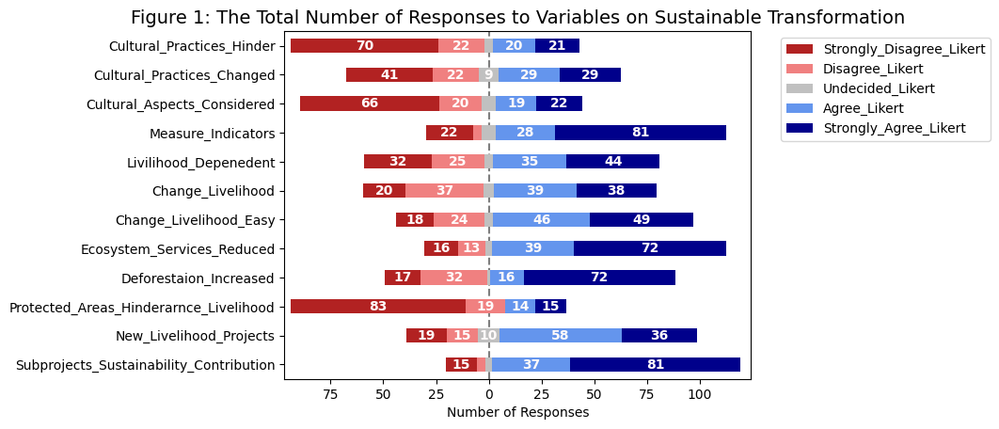

In [188]:
%matplotlib inline
plot_likert.plot_counts(all_counts2, plot_likert.scales.agree,  plot_percentage=False, bar_labels=True, bar_labels_color="snow", colors=plot_likert.colors.default_with_darker_neutral)
plt.title("Figure 1: The Total Number of Responses to Variables on Sustainable Transformation", fontsize=14)
plt.show()

### 7.4 Converting the Responses to Percentages
    The responses were converted to percentages

In [189]:
all_counts3 = df3.apply(lambda col: col.value_counts(normalize=True, dropna=False).round(2))

In [190]:
all_counts3 

,Cultural_Practices_Hinder,Cultural_Practices_Changed,Cultural_Aspects_Considered,Measure_Indicators,Livilihood_Depenedent,Change_Livelihood,Change_Livelihood_Easy,Ecosystem_Services_Reduced,Deforestaion_Increased,Protected_Areas_Hinderarnce_Livelihood,New_Livelihood_Projects,Subprojects_Sustainability_Contribution
Agree_Likert,0.13,0.19,0.13,0.19,0.23,0.26,0.31,0.26,0.11,0.09,0.39,0.25
Disagree_Likert,0.15,0.15,0.13,0.03,0.17,0.25,0.16,0.09,0.21,0.13,0.10,0.03
Strongly_Agree_Likert,0.14,0.19,0.15,0.54,0.29,0.25,0.33,0.48,0.48,0.10,0.24,0.54
Strongly_Disagree_Likert,0.47,0.27,0.44,0.15,0.21,0.13,0.12,0.11,0.11,0.55,0.13,0.10
Undecided_Likert,0.03,0.06,0.05,0.05,0.03,0.03,0.03,0.02,0.01,NaN,0.07,0.02
NaN,0.09,0.13,0.11,0.05,0.07,0.07,0.06,0.05,0.08,0.13,0.08,0.07


#### 7.4.1 Transposing the Dataframe Table
      Interchanging the rows and columns

In [191]:
all_counts4 = all_counts3.head().T

In [192]:
all_counts4

,Agree_Likert,Disagree_Likert,Strongly_Agree_Likert,Strongly_Disagree_Likert,Undecided_Likert
Cultural_Practices_Hinder,0.13,0.15,0.14,0.47,0.03
Cultural_Practices_Changed,0.19,0.15,0.19,0.27,0.06
Cultural_Aspects_Considered,0.13,0.13,0.15,0.44,0.05
Measure_Indicators,0.19,0.03,0.54,0.15,0.05
Livilihood_Depenedent,0.23,0.17,0.29,0.21,0.03
Change_Livelihood,0.26,0.25,0.25,0.13,0.03
Change_Livelihood_Easy,0.31,0.16,0.33,0.12,0.03
Ecosystem_Services_Reduced,0.26,0.09,0.48,0.11,0.02
Deforestaion_Increased,0.11,0.21,0.48,0.11,0.01
Protected_Areas_Hinderarnce_Livelihood,0.09,0.13,0.10,0.55,NaN


#### 7.4.2 Changing the Order of Columns
      The order of columns was changed

In [193]:
all_counts5 = all_counts4.iloc[:, [3, 1, 4, 0, 2]]

In [194]:
all_counts5 

,Strongly_Disagree_Likert,Disagree_Likert,Undecided_Likert,Agree_Likert,Strongly_Agree_Likert
Cultural_Practices_Hinder,0.47,0.15,0.03,0.13,0.14
Cultural_Practices_Changed,0.27,0.15,0.06,0.19,0.19
Cultural_Aspects_Considered,0.44,0.13,0.05,0.13,0.15
Measure_Indicators,0.15,0.03,0.05,0.19,0.54
Livilihood_Depenedent,0.21,0.17,0.03,0.23,0.29
Change_Livelihood,0.13,0.25,0.03,0.26,0.25
Change_Livelihood_Easy,0.12,0.16,0.03,0.31,0.33
Ecosystem_Services_Reduced,0.11,0.09,0.02,0.26,0.48
Deforestaion_Increased,0.11,0.21,0.01,0.11,0.48
Protected_Areas_Hinderarnce_Livelihood,0.55,0.13,NaN,0.09,0.10


#### 7.4.3 Visualising the Results
    The results are visualised as pecentages

C:\Users\nazin\AppData\Local\anaconda3\envs\NLTK_Py_3_12\Lib\site-packages\plot_likert\plot_likert.py:101: FutureWarning: parameter `plot_percentage` for `plot_likert.likert_counts` is deprecated, set it to None and use `compute_percentages` instead
  warn(


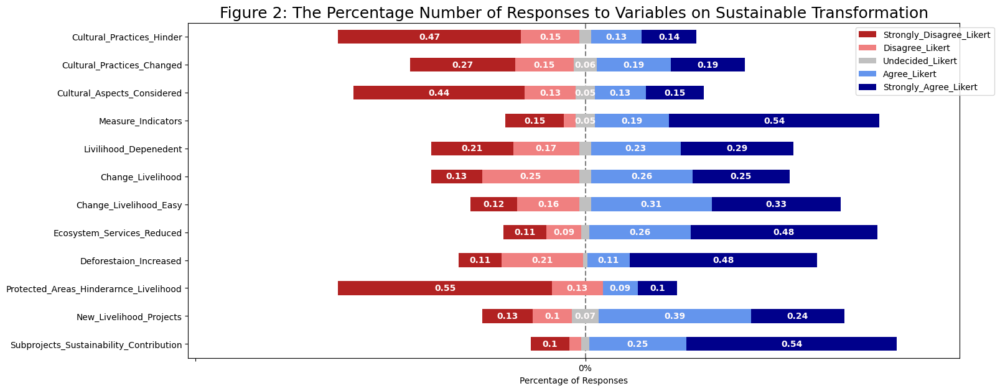

In [195]:
%matplotlib inline
plot_likert.plot_counts(all_counts5, plot_likert.scales.agree,  plot_percentage=True, figsize=(16, 7), bar_labels=True, bar_labels_color="snow", colors=plot_likert.colors.default_with_darker_neutral)
plt.title("Figure 2: The Percentage Number of Responses to Variables on Sustainable Transformation", fontsize=18)
plt.show()

[<a href="#Purpose-of-the-Analysis">Back to top</a>]

## 8. Defined or Responses with Choices
    The responses that had choices other than those with a likert scale were grouped in a pandas dataframe looking the following question:
    
1. '50. What is the main purpose of landscapes (Forests, Water Bodies, Wetlands… etc.) in your livelihood?': 'Purpose_Landscape', 
2. '52. How is your connection to nature like?': 'Connection_Nature', 
3. '54. How long have you worked on this livelihood project?': 'Range_Years',
4. '64. Which livelihood is a major contributor to landscape transformation?': 'Contributor_Landscape_Transformation',
5. '66. Which type of landscape do you depend on much for a livelihood?': 'Landscape_Depended_Livelihood'
    

In [196]:
df4=df2.drop(df2.columns[[0,1,2,3,4,5,6,7,8,9,10,11,12,14,16,18,19,20,21,22,23,24,25,26,28,30,31,32,33,34]], axis = 1)

In [197]:
df4

,Purpose_Landscape,Connection_Nature,Range_Years,Contributor_Landscape_Transformation,Landscape_Depended_Livelihood
0,Nature_Protection_Purpose,"Psychological_Connection,Material_Connection",3to4Years_Long,Wood_Extraction,Agriculture_Areas_Dependent
1,Nature_Protection_Purpose,"Philosophical_Connection,Psychological_Connection",Greaterthan9Years_Long,Land_Agriculture,Wetlands_Dependent
2,"Nature_Protection_Purpose,Ancestral_Shrines_Purpose",Experiential_Connection,5to6Years_Long,Wood_Extraction,"Agriculture_Areas_Dependent,Wetlands_Dependent"
3,Source_Income_Purpose,Material_Connection,Greaterthan9Years_Long,Land_Agriculture,Agriculture_Areas_Dependent
4,Nature_Protection_Purpose,"Philosophical_Connection,Psychological_Connection",5to6Years_Long,Land_Agriculture,"Forest_Dependent,Wetlands_Dependent"
5,Nature_Protection_Purpose,Psychological_Connection,5to6Years_Long,Land_Agriculture,Agriculture_Areas_Dependent
6,Source_Income_Purpose,Material_Connection,NaN,Wood_Extraction,Agriculture_Areas_Dependent
7,Source_Income_Purpose,Material_Connection,3to4Years_Long,Land_Agriculture,"Wetlands_Dependent,Agriculture_Areas_Dependent"
8,NaN,Material_Connection,3to4Years_Long,Wood_Extraction,Agriculture_Areas_Dependent
9,NaN,Philosophical_Connection,3to4Years_Long,Land_Agriculture,Agriculture_Areas_Dependent


### 8.1 The Purpose of Landscape to People

In [198]:
PL = df4['Purpose_Landscape'].value_counts(dropna=False)
PL_P = (df4['Purpose_Landscape'].value_counts(normalize=True, dropna=False).round(2))

In [199]:
PL_P

Purpose_Landscape
Nature_Protection_Purpose                              0.62
NaN                                                    0.22
Source_Income_Purpose                                  0.11
Nature_Protection_Purpose,Other_Purpose                0.01
Nature_Protection_Purpose,Ancestral_Shrines_Purpose    0.01
Source_Income_Purpose,Nature_Protection_Purpose        0.01
Nature_Protection_Purpose,Source_Income_Purpose        0.01
Source_Income_Purpose,Other_Purpose                    0.01
No_Idea_Purpose                                        0.01
Other_Purpose                                          0.01
Name: proportion, dtype: float64

In [200]:
df_PL = pd.DataFrame(PL)

In [201]:
df_PL

,count
Purpose_Landscape,
Nature_Protection_Purpose,93
NaN,33
Source_Income_Purpose,16
"Nature_Protection_Purpose,Other_Purpose",2
"Nature_Protection_Purpose,Ancestral_Shrines_Purpose",1
"Source_Income_Purpose,Nature_Protection_Purpose",1
"Nature_Protection_Purpose,Source_Income_Purpose",1
"Source_Income_Purpose,Other_Purpose",1
No_Idea_Purpose,1


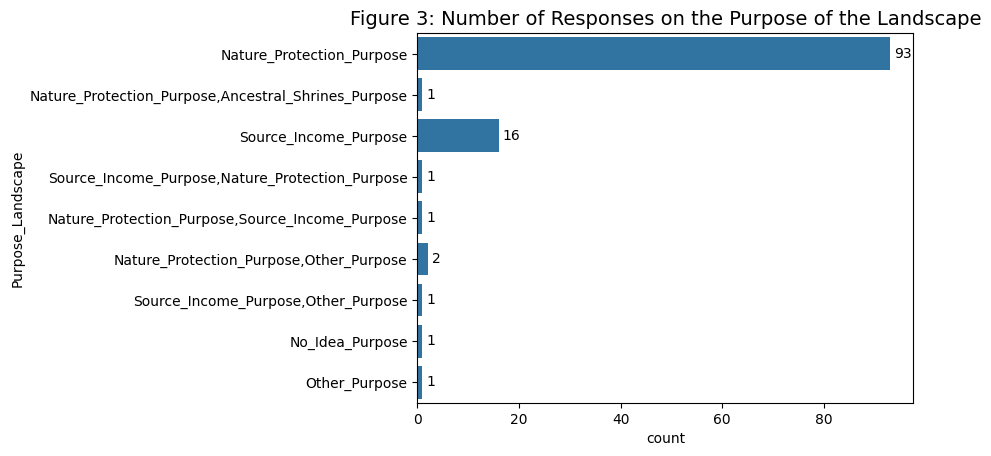

In [202]:
ax = sns.countplot(df4["Purpose_Landscape"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 3: Number of Responses on the Purpose of the Landscape", fontsize=14)
plt.show()

### 8.2 The Connection of Nature to People

In [203]:
CN = df4['Connection_Nature'].value_counts(dropna=False)
CN_P = (df4['Connection_Nature'].value_counts(normalize=True, dropna=False).round(2))

In [204]:
CN_P

Connection_Nature
Material_Connection                                  0.82
NaN                                                  0.09
Other_Connection                                     0.04
Experiential_Connection                              0.01
Philosophical_Connection,Psychological_Connection    0.01
Psychological_Connection,Material_Connection         0.01
Psychological_Connection                             0.01
Philosophical_Connection                             0.01
Experiential_Connection,Material_Connection          0.01
Name: proportion, dtype: float64

In [205]:
df_CN = pd.DataFrame(CN)

In [206]:
df_CN

,count
Connection_Nature,
Material_Connection,123
NaN,13
Other_Connection,6
Experiential_Connection,2
"Philosophical_Connection,Psychological_Connection",2
"Psychological_Connection,Material_Connection",1
Psychological_Connection,1
Philosophical_Connection,1
"Experiential_Connection,Material_Connection",1


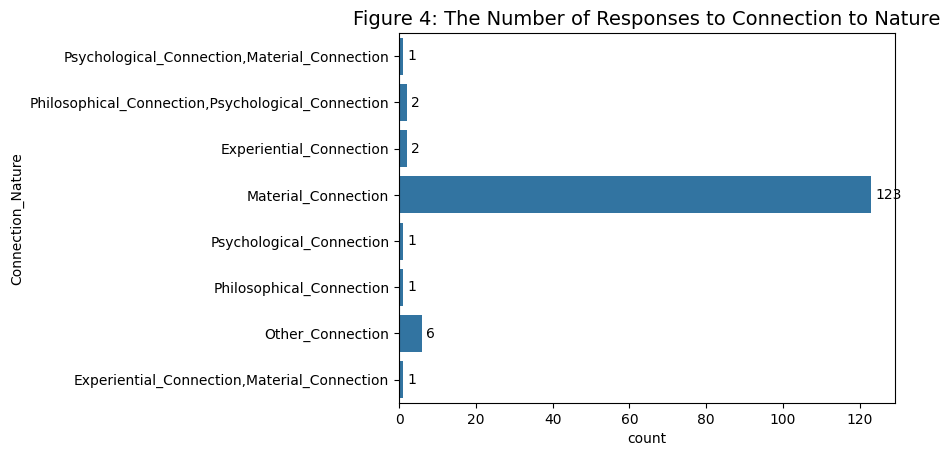

In [207]:
ax = sns.countplot(df4["Connection_Nature"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 4: The Number of Responses to Connection to Nature", fontsize=14)
plt.show()

In [208]:
agreement_levels = ["Material_Connection", "Other_Connection"]
CN_R = df2[df2["Connection_Nature"].isin(agreement_levels)]
CN_R1 = CN_R.drop(CN_R.columns[[0,1,2,3,4,6,7,8,9,10,11,12,13,14,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)
CN_R1grouped = CN_R1.groupby('Name_Main_Project')['Connection_Nature']
CN_R1

,Name_Main_Project,Connection_Nature,Connection_Nature_Reasons
3,TRALARD_LNM,Material_Connection,To use some of them for income
6,TRALARD_LNM,Material_Connection,They are a source of income and for the future generation to see them
7,TRALARD_LNM,Material_Connection,Source of income
8,TRALARD_LNM,Material_Connection,It is a source of income
10,TRALARD_LNM,Material_Connection,Thats were we get income as well as for example cattle we use it for cultivating
11,TRALARD_LNM,Material_Connection,The game parks help us as a source of income in form of meat from animals and tree it is were rains can come from if they are protected
12,TRALARD_LNM,Other_Connection,There is need to keep the fish for instance fish in the ponds so that they do not get extinct
13,TRALARD_LNM,Material_Connection,Because we are the ones who look after them on a daily basis
14,TRALARD_LNM,Material_Connection,It is a source of livelihood
15,TRALARD_LNM,Other_Connection,"There is need to protect nature for instance cutting down trees along the river, will lead it to drying and destruction of animals or biodiversity in the river"


In [209]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CN_R1.iterrows():
    CN_R1_filter_sentence = []
    CN_R1_sentence = row["Connection_Nature_Reasons"]
    if pd.isnull(CN_R1_sentence):
       continue
    CN_R1_sentence_cleaned = re.sub(r'[^\w\s]','',CN_R1_sentence)
    CN_R1_words = nltk.word_tokenize(CN_R1_sentence_cleaned)
    CN_R1_words = [lemmatizer.lemmatize(w) for w in CN_R1_words if w.lower() not in stop_words]
    CN_R1_filter_sentence.extend(CN_R1_words)
    print(CN_R1_filter_sentence)

['use', 'income']
['source', 'income', 'future', 'generation', 'see']
['Source', 'income']
['source', 'income']
['Thats', 'get', 'income', 'well', 'example', 'cattle', 'use', 'cultivating']
['game', 'park', 'help', 'u', 'source', 'income', 'form', 'meat', 'animal', 'tree', 'rain', 'come', 'protected']
['need', 'keep', 'fish', 'instance', 'fish', 'pond', 'get', 'extinct']
['one', 'look', 'daily', 'basis']
['source', 'livelihood']
['need', 'protect', 'nature', 'instance', 'cutting', 'tree', 'along', 'river', 'lead', 'drying', 'destruction', 'animal', 'biodiversity', 'river']
['answer']
['purpose', 'future', 'meet', 'need']
['source', 'income']
['tree', 'help', 'u', 'bring', 'rainfall']
['Source', 'income']
['harvest', 'right', 'time', 'prevent', 'management', 'natural', 'resource', 'properly']
['taking', 'care']
['Source', 'income']
['Source', 'income']
['bring', 'development', 'tourism']
['income']
['natural', 'resource', 'like', 'tree', 'give', 'shade', 'medicine', 'also', 'get', 'fres

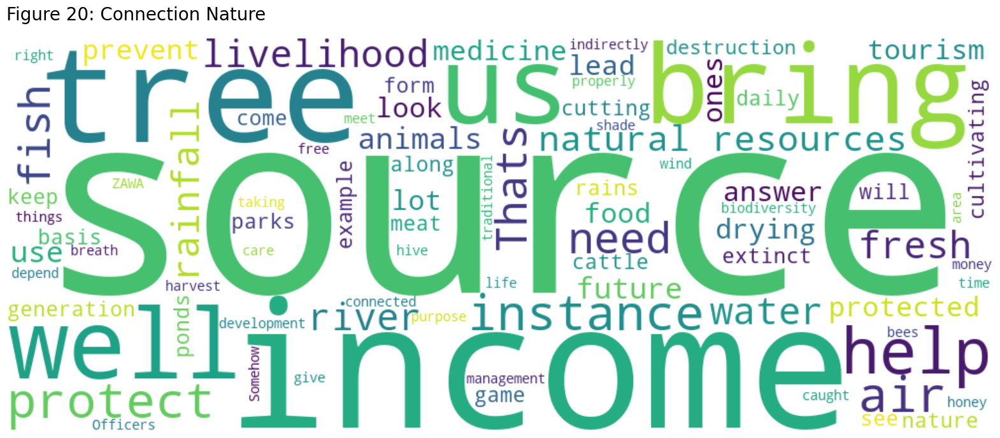

In [210]:
CN_R1["Connection_Nature_Reasons"] = CN_R1["Connection_Nature_Reasons"].fillna("")  
CN_R1["Connection_Nature_Reasons"] = CN_R1["Connection_Nature_Reasons"].astype(str)
CN_R1_Text = " ".join(CN_R1["Connection_Nature_Reasons"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CN_R1_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Connection Nature", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

### 8.3 The Length of Existence of the Livelihood Project

In [211]:
RY_grouped = df2.groupby('Name_Main_Project')['Range_Years'].value_counts(dropna=False)

In [212]:
RY_grouped

Name_Main_Project                     Range_Years           
EbA_CENTRAL_MUCHINGA_LUAPULA          3to4Years_Long             2
                                      NaN                        1
Ecosystem Conservation_NORTH_WESTERN  3to4Years_Long             8
                                      NaN                        2
                                      7to8Years_Long             1
PIN_WESTERN                           3to4Years_Long             5
                                      NaN                        1
SCRALA_SOUTHERN_WESTERN_NORTHEN       3to4Years_Long            12
                                      5to6Years_Long             9
                                      Lessthan2Years_Long        6
                                      Greaterthan9Years_Long     2
                                      7to8Years_Long             1
SCReBS_WESTERN                        5to6Years_Long             5
                                      7to8Years_Long             5
 

In [213]:
RY_grouped1 = pd.DataFrame(RY_grouped)

In [214]:
RY_grouped1

count
Name_Main_Project                    Range_Years                  
EbA_CENTRAL_MUCHINGA_LUAPULA         3to4Years_Long              2
                                     NaN                         1
Ecosystem Conservation_NORTH_WESTERN 3to4Years_Long              8
                                     NaN                         2
                                     7to8Years_Long              1
PIN_WESTERN                          3to4Years_Long              5
                                     NaN                         1
SCRALA_SOUTHERN_WESTERN_NORTHEN      3to4Years_Long             12
                                     5to6Years_Long              9
                                     Lessthan2Years_Long         6
                                     Greaterthan9Years_Long      2
                                     7to8Years_Long              1
SCReBS_WESTERN                       5to6Years_Long              5
                                     7to8Years_Long              5
                                     Greaterthan9Years_Long      3
                                     3to4Years_Long              2
SCRiKA_LS                            5to6Years_Long             31
                                     3to4Years_Long              6
                                     NaN                         5
                                     7to8Years_Long              2
TRALARD_LNM                          3to4Years_Long             28
                                     5to6Years_Long              5
                                     Lessthan2Years_Long         3
                                     Greaterthan9Years_Long      2
                                     NaN                         2

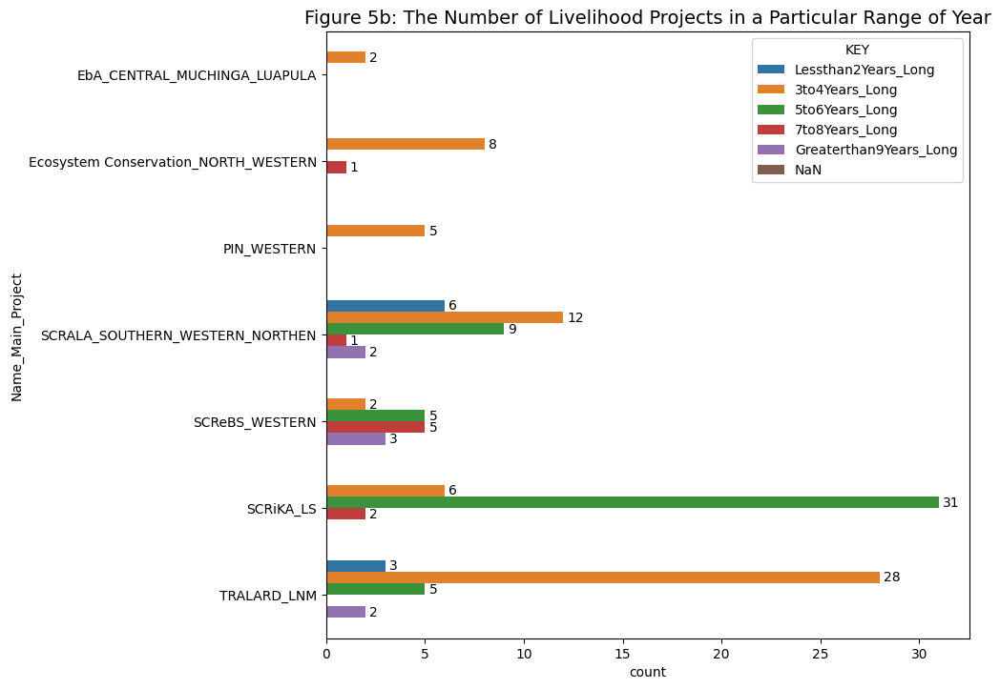

In [215]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Lessthan2Years_Long", "3to4Years_Long", "5to6Years_Long", "7to8Years_Long", "Greaterthan9Years_Long", "NaN"]
ax = sns.barplot(data = RY_grouped1, x="count", y="Name_Main_Project", hue="Range_Years", hue_order=hue_order, legend=True)
ax.set_title("Figure 5b: The Number of Livelihood Projects in a Particular Range of Year", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

In [216]:
LP = df4['Range_Years'].value_counts(dropna=False)
LP_P = (df4['Range_Years'].value_counts(normalize=True, dropna=False).round(2))

In [217]:
LP_P

Range_Years
3to4Years_Long            0.42
5to6Years_Long            0.33
NaN                       0.08
Lessthan2Years_Long       0.06
7to8Years_Long            0.06
Greaterthan9Years_Long    0.05
Name: proportion, dtype: float64

In [218]:
df_LP = pd.DataFrame(LP)

In [219]:
df_LP

,count
Range_Years,
3to4Years_Long,63
5to6Years_Long,50
NaN,12
Lessthan2Years_Long,9
7to8Years_Long,9
Greaterthan9Years_Long,7


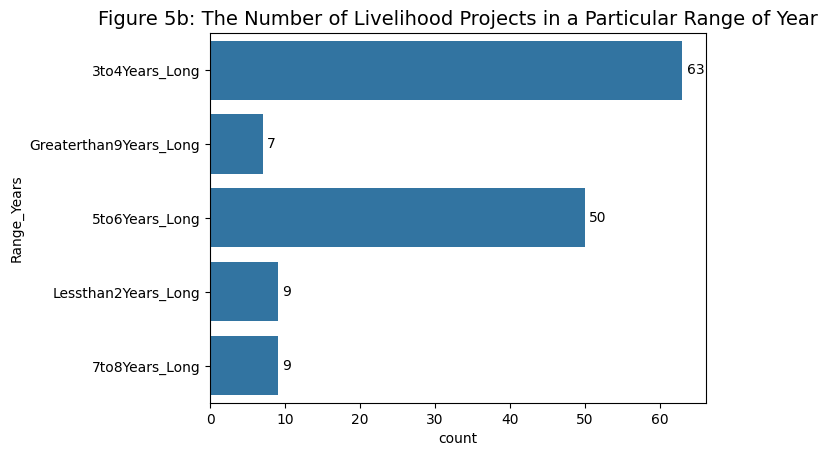

In [220]:
ax = sns.countplot(df4["Range_Years"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 5b: The Number of Livelihood Projects in a Particular Range of Year", fontsize=14)
plt.show()

### 8.4 Major Contributor to Landscape Transformation

In [221]:
CLT_grouped = df2.groupby('Name_Main_Project')['Contributor_Landscape_Transformation'].value_counts(dropna=False)

In [222]:
CLT_grouped

Name_Main_Project                     Contributor_Landscape_Transformation
EbA_CENTRAL_MUCHINGA_LUAPULA          Land_Agriculture                         3
Ecosystem Conservation_NORTH_WESTERN  Land_Agriculture                         3
                                      Uncontrolled_Fires                       3
                                      NaN                                      3
                                      Uncontrolled_Fires,Land_Agriculture      1
                                      Wood_Extraction                          1
PIN_WESTERN                           Uncontrolled_Fires                       3
                                      Wood_Extraction                          2
                                      NaN                                      1
SCRALA_SOUTHERN_WESTERN_NORTHEN       Uncontrolled_Fires                      19
                                      Wood_Extraction                          7
                                  

In [223]:
CLT_grouped1 = pd.DataFrame(CLT_grouped)

In [224]:
CLT_grouped1

count
Name_Main_Project                    Contributor_Landscape_Transformation       
EbA_CENTRAL_MUCHINGA_LUAPULA         Land_Agriculture                          3
Ecosystem Conservation_NORTH_WESTERN Land_Agriculture                          3
                                     Uncontrolled_Fires                        3
                                     NaN                                       3
                                     Uncontrolled_Fires,Land_Agriculture       1
                                     Wood_Extraction                           1
PIN_WESTERN                          Uncontrolled_Fires                        3
                                     Wood_Extraction                           2
                                     NaN                                       1
SCRALA_SOUTHERN_WESTERN_NORTHEN      Uncontrolled_Fires                       19
                                     Wood_Extraction                           7
                                     Land_Agriculture                          2
                                     NaN                                       2
SCReBS_WESTERN                       Uncontrolled_Fires                        7
                                     Wood_Extraction                           5
                                     Land_Agriculture                          2
                                     Other                                     1
SCRiKA_LS                            Uncontrolled_Fires                       13
                                     Land_Agriculture                         12
                                     Wood_Extraction                          11
                                     NaN                                       6
                                     Uncontrolled_Grazing                      2
TRALARD_LNM                          Land_Agriculture                         22
                                     Wood_Extraction                          13
                                     Uncontrolled_Fires                        4
                                     NaN                                       1

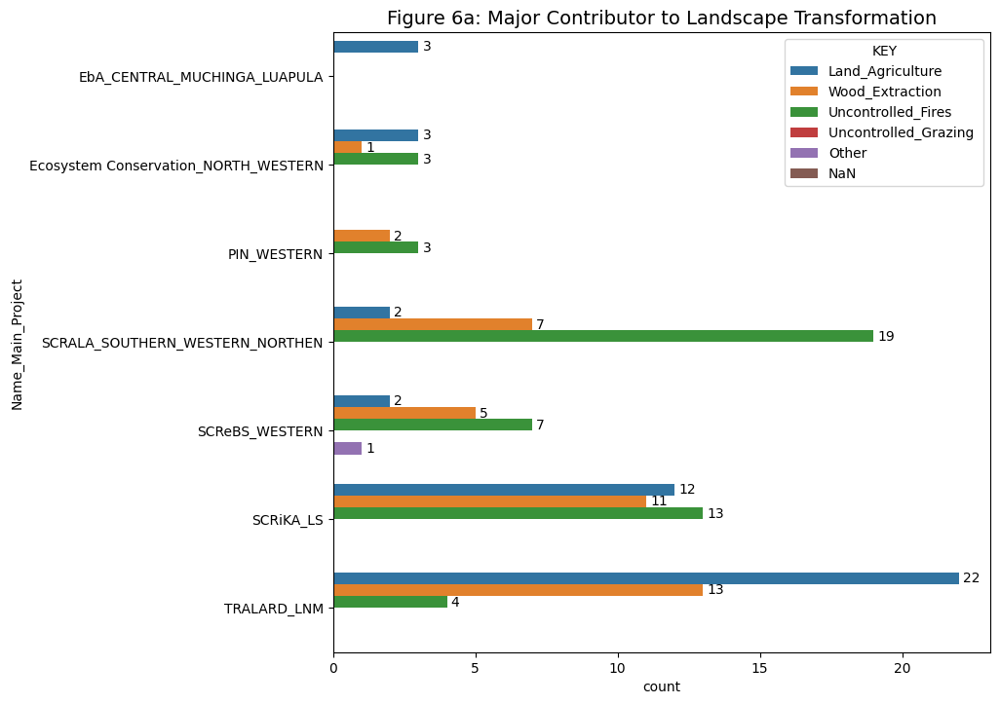

In [225]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Land_Agriculture", "Wood_Extraction", "Uncontrolled_Fires", "Uncontrolled_Grazing ", "Other", "NaN"]
ax = sns.barplot(data = CLT_grouped1, x="count", y="Name_Main_Project", hue="Contributor_Landscape_Transformation", hue_order=hue_order, legend=True)
ax.set_title("Figure 6a: Major Contributor to Landscape Transformation", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

In [226]:
CLT = df4['Contributor_Landscape_Transformation'].value_counts(dropna=False)
CLT_P = (df4['Contributor_Landscape_Transformation'].value_counts(normalize=True, dropna=False).round(2))

In [227]:
CLT_P

Contributor_Landscape_Transformation
Uncontrolled_Fires                     0.33
Land_Agriculture                       0.29
Wood_Extraction                        0.26
NaN                                    0.09
Uncontrolled_Grazing                   0.01
Uncontrolled_Fires,Land_Agriculture    0.01
Other                                  0.01
Name: proportion, dtype: float64

In [228]:
df_CLT = pd.DataFrame(CLT)

In [229]:
df_CLT

,count
Contributor_Landscape_Transformation,
Uncontrolled_Fires,49
Land_Agriculture,44
Wood_Extraction,39
NaN,14
Uncontrolled_Grazing,2
"Uncontrolled_Fires,Land_Agriculture",1
Other,1


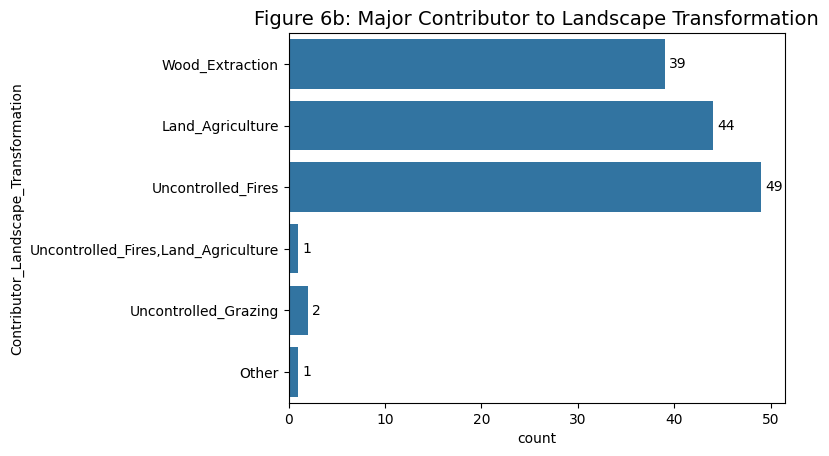

In [230]:
ax = sns.countplot(df4["Contributor_Landscape_Transformation"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 6b: Major Contributor to Landscape Transformation", fontsize=14)
plt.show()

In [231]:
agreement_levels = ["Wood_Extration", "Land_Agriculture","Uncontrolled_Fires"]
CLT_R = df2[df2["Contributor_Landscape_Transformation"].isin(agreement_levels)]
CLT_R1 = CN_R.drop(CLT_R.columns[[0,1,2,3,4,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,29,30,31,32,33,34]], axis = 1)
CLT_R1grouped = CLT_R1.groupby('Name_Main_Project')['Contributor_Landscape_Transformation']
CLT_R1

,Name_Main_Project,Contributor_Landscape_Transformation,Contributor_Landscape_Transformation_Reasons
3,TRALARD_LNM,Land_Agriculture,Because it requires a huge land than the others like making charcoal
6,TRALARD_LNM,Wood_Extraction,The burning of charcoal give smoke that destroys the ozone layer as well as it brings acidic rains
7,TRALARD_LNM,Land_Agriculture,There are agriculture activities for food
8,TRALARD_LNM,Wood_Extraction,There is no electricity thus a huge demand for energy
10,TRALARD_LNM,Wood_Extraction,The charcoal purposes is bad because the land is left bare unlike for agriculture cutting which is replaced with other plants
11,TRALARD_LNM,Land_Agriculture,"The cultivation of cassava requires always barren land that has never been cultivated before for it to grow well but if other crops such as beans, vegetables maize can reduce deforestation"
12,TRALARD_LNM,Uncontrolled_Fires,They burn down the trees that were about to shoot up
13,TRALARD_LNM,Land_Agriculture,Chitemene system for cultivation leads to deforestation than the others
14,TRALARD_LNM,Land_Agriculture,It is a source of food for most people in the area
15,TRALARD_LNM,Land_Agriculture,Thats were we get our livelihoods


In [232]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CLT_R1.iterrows():
    CLT_R1_filter_sentence = []
    CLT_R1_sentence = row["Contributor_Landscape_Transformation_Reasons"]
    if pd.isnull(CLT_R1_sentence):
       continue
    CLT_R1_sentence_cleaned = re.sub(r'[^\w\s]','',CLT_R1_sentence)
    CLT_R1_words = nltk.word_tokenize(CLT_R1_sentence_cleaned)
    CLT_R1_words = [lemmatizer.lemmatize(w) for w in CLT_R1_words if w.lower() not in stop_words]
    CLT_R1_filter_sentence.extend(CLT_R1_words)
    print(CLT_R1_filter_sentence)

['requires', 'huge', 'land', 'others', 'like', 'making', 'charcoal']
['burning', 'charcoal', 'give', 'smoke', 'destroys', 'ozone', 'layer', 'well', 'brings', 'acidic', 'rain']
['agriculture', 'activity', 'food']
['electricity', 'thus', 'huge', 'demand', 'energy']
['charcoal', 'purpose', 'bad', 'land', 'left', 'bare', 'unlike', 'agriculture', 'cutting', 'replaced', 'plant']
['cultivation', 'cassava', 'requires', 'always', 'barren', 'land', 'never', 'cultivated', 'grow', 'well', 'crop', 'bean', 'vegetable', 'maize', 'reduce', 'deforestation']
['burn', 'tree', 'shoot']
['Chitemene', 'system', 'cultivation', 'lead', 'deforestation', 'others']
['source', 'food', 'people', 'area']
['Thats', 'get', 'livelihood']
['source', 'income']
['time', 'cut', 'tree', 'even', 'want', 'cultivate', 'well', 'burining', 'kill', 'animal', 'necesary', 'making', 'soil', 'fertile']
['Buring', 'destroy', 'product', 'crop', 'soil']
['cutting', 'treed', 'change', 'landscape']
['cutting', 'tress', 'destroys', 'much'

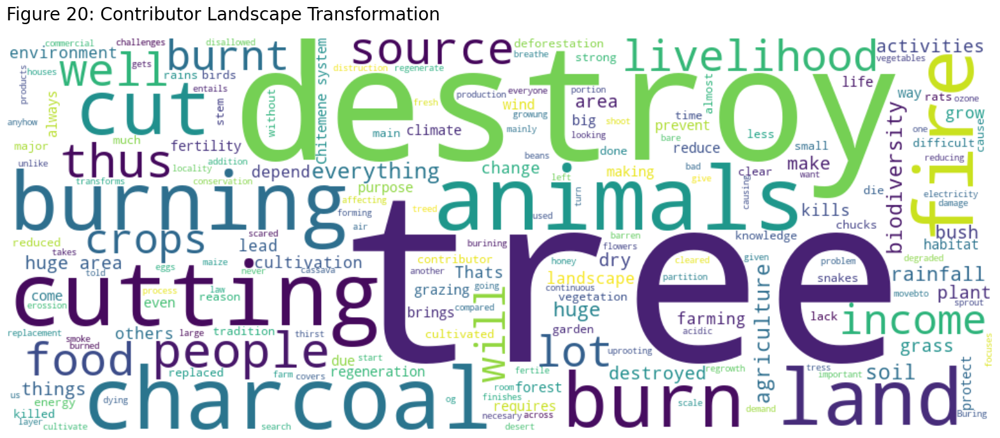

In [233]:
CLT_R1["Contributor_Landscape_Transformation_Reasons"] = CLT_R1["Contributor_Landscape_Transformation_Reasons"].fillna("")  
CLT_R1["Contributor_Landscape_Transformation_Reasons"] = CLT_R1["Contributor_Landscape_Transformation_Reasons"].astype(str)
CLT_R1_Text = " ".join(CLT_R1["Contributor_Landscape_Transformation_Reasons"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CLT_R1_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Contributor Landscape Transformation", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

### 8.5 The Landscape Depended on for a Livelihood

In [234]:
LDL_grouped = df2.groupby('Name_Main_Project')['Landscape_Depended_Livelihood'].value_counts(dropna=False)

In [235]:
LDL_grouped

Name_Main_Project                     Landscape_Depended_Livelihood                 
EbA_CENTRAL_MUCHINGA_LUAPULA          Agriculture_Areas_Dependent                        3
Ecosystem Conservation_NORTH_WESTERN  NaN                                                5
                                      Agriculture_Areas_Dependent                        3
                                      Forest_Dependent                                   2
                                      Wetlands_Dependent                                 1
PIN_WESTERN                           Agriculture_Areas_Dependent                        5
                                      NaN                                                1
SCRALA_SOUTHERN_WESTERN_NORTHEN       Agriculture_Areas_Dependent                       21
                                      Wetlands_Dependent                                 6
                                      Forest_Dependent                                   2
     

In [236]:
LDL_grouped1 = pd.DataFrame(LDL_grouped)

In [237]:
LDL_grouped1

count
Name_Main_Project                    Landscape_Depended_Livelihood                        
EbA_CENTRAL_MUCHINGA_LUAPULA         Agriculture_Areas_Dependent                         3
Ecosystem Conservation_NORTH_WESTERN NaN                                                 5
                                     Agriculture_Areas_Dependent                         3
                                     Forest_Dependent                                    2
                                     Wetlands_Dependent                                  1
PIN_WESTERN                          Agriculture_Areas_Dependent                         5
                                     NaN                                                 1
SCRALA_SOUTHERN_WESTERN_NORTHEN      Agriculture_Areas_Dependent                        21
                                     Wetlands_Dependent                                  6
                                     Forest_Dependent                                    2
                                     NaN                                                 1
SCReBS_WESTERN                       Agriculture_Areas_Dependent                        10
                                     Wetlands_Dependent                                  5
SCRiKA_LS                            Agriculture_Areas_Dependent                        30
                                     Forest_Dependent                                    4
                                     Wetlands_Dependent                                  4
                                     NaN                                                 4
                                     Wetlands_Dependent,Forest_Dependent                 2
TRALARD_LNM                          Agriculture_Areas_Dependent                        20
                                     Wetlands_Dependent                                  9
                                     Forest_Dependent                                    5
                                     Wetlands_Dependent,Forest_Dependent                 2
                                     Agriculture_Areas_Dependent,Wetlands_Dependent      1
                                     Forest_Dependent,Wetlands_Dependent                 1
                                     Wetlands_Dependent,Agriculture_Areas_Dependent      1
                                     NaN                                                 1

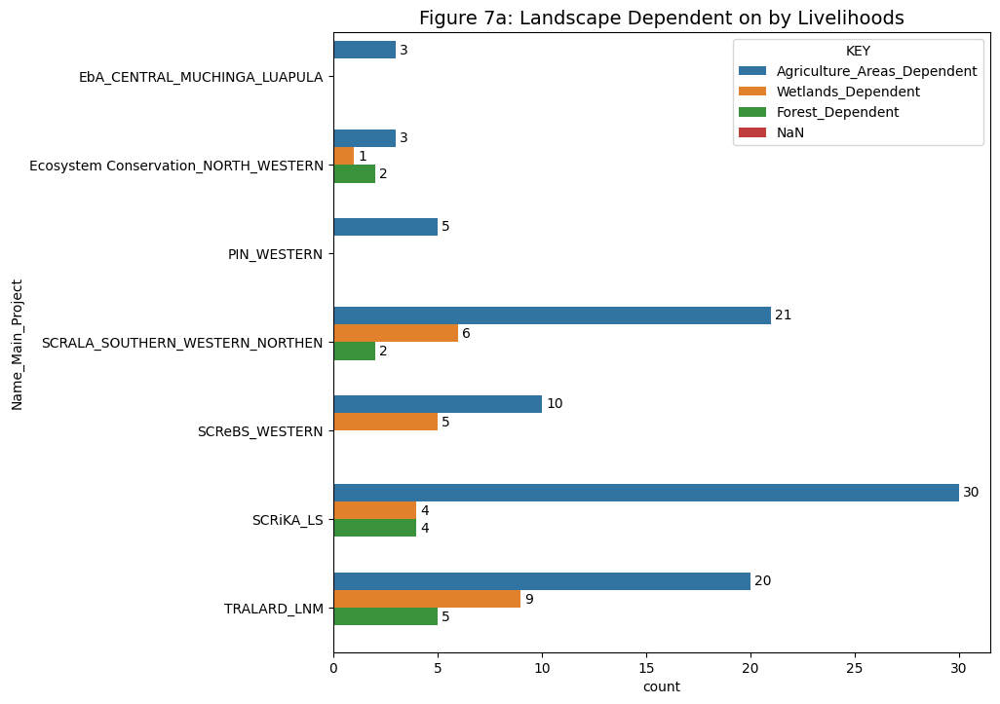

In [238]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Agriculture_Areas_Dependent", "Wetlands_Dependent", "Forest_Dependent", "NaN"]
ax = sns.barplot(data = LDL_grouped1, x="count", y="Name_Main_Project", hue="Landscape_Depended_Livelihood", hue_order=hue_order, legend=True)
ax.set_title("Figure 7a: Landscape Dependent on by Livelihoods", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

In [239]:
LDL = df4['Landscape_Depended_Livelihood'].value_counts(dropna=False)
LDL_P = (df4['Landscape_Depended_Livelihood'].value_counts(normalize=True, dropna=False).round(2))

In [240]:
LDL_P

Landscape_Depended_Livelihood
Agriculture_Areas_Dependent                       0.61
Wetlands_Dependent                                0.17
Forest_Dependent                                  0.09
NaN                                               0.09
Wetlands_Dependent,Forest_Dependent               0.03
Agriculture_Areas_Dependent,Wetlands_Dependent    0.01
Forest_Dependent,Wetlands_Dependent               0.01
Wetlands_Dependent,Agriculture_Areas_Dependent    0.01
Name: proportion, dtype: float64

In [241]:
df_LDL = pd.DataFrame(LDL)

In [242]:
df_LDL

,count
Landscape_Depended_Livelihood,
Agriculture_Areas_Dependent,92
Wetlands_Dependent,25
Forest_Dependent,13
NaN,13
"Wetlands_Dependent,Forest_Dependent",4
"Agriculture_Areas_Dependent,Wetlands_Dependent",1
"Forest_Dependent,Wetlands_Dependent",1
"Wetlands_Dependent,Agriculture_Areas_Dependent",1


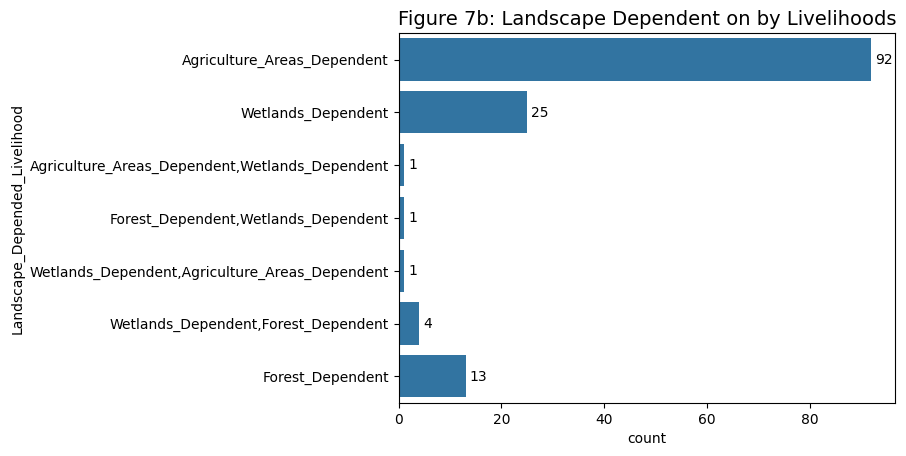

In [243]:
ax = sns.countplot(df4["Landscape_Depended_Livelihood"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 7b: Landscape Dependent on by Livelihoods", fontsize=14)
plt.show()

In [244]:
agreement_levels = ["Agriculture_Areas_Dependent", "Wetlands_Dependent","Forest_Dependent"]
LDL_R = df2[df2["Landscape_Depended_Livelihood"].isin(agreement_levels)]
LDL_R1 = LDL_R.drop(LDL_R.columns[[0,1,2,3,4,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,31,32,33,34]], axis = 1)
LDL_R1grouped = LDL_R1.groupby('Name_Main_Project')['Landscape_Depended_Livelihood']
LDL_R1

,Name_Main_Project,Landscape_Depended_Livelihood,Landscape_Depeneded_Livelihood_Reasons
0,TRALARD_LNM,Agriculture_Areas_Dependent,He cultivates a large area of land so that some crops can be sold for a livelihood
1,TRALARD_LNM,Wetlands_Dependent,The catching of fish is the source of income in this area
3,TRALARD_LNM,Agriculture_Areas_Dependent,Food is the main source of livelihood thus without it there is no way to earn a living
5,TRALARD_LNM,Agriculture_Areas_Dependent,That is a source of income as well as food for consumption
6,TRALARD_LNM,Agriculture_Areas_Dependent,The farming helps in sourcing of food
8,TRALARD_LNM,Agriculture_Areas_Dependent,Thats a source of income
9,TRALARD_LNM,Agriculture_Areas_Dependent,It is a source of livelihood
10,TRALARD_LNM,Agriculture_Areas_Dependent,It is where income comes from for a living
11,TRALARD_LNM,Agriculture_Areas_Dependent,"It helps us cultivate cassava and maize, there is not much fishing activity"
12,TRALARD_LNM,Agriculture_Areas_Dependent,From farming we obtain food for consumption at household level


In [245]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in LDL_R1.iterrows():
    LDL_R1_filter_sentence = []
    LDL_R1_sentence = row["Landscape_Depeneded_Livelihood_Reasons"]
    if pd.isnull(LDL_R1_sentence):
       continue
    LDL_R1_sentence_cleaned = re.sub(r'[^\w\s]','',LDL_R1_sentence)
    LDL_R1_words = nltk.word_tokenize(LDL_R1_sentence_cleaned)
    LDL_R1_words = [lemmatizer.lemmatize(w) for w in LDL_R1_words if w.lower() not in stop_words]
    LDL_R1_filter_sentence.extend(LDL_R1_words)
    print(LDL_R1_filter_sentence)

['cultivates', 'large', 'area', 'land', 'crop', 'sold', 'livelihood']
['catching', 'fish', 'source', 'income', 'area']
['Food', 'main', 'source', 'livelihood', 'thus', 'without', 'way', 'earn', 'living']
['source', 'income', 'well', 'food', 'consumption']
['farming', 'help', 'sourcing', 'food']
['Thats', 'source', 'income']
['source', 'livelihood']
['income', 'come', 'living']
['help', 'u', 'cultivate', 'cassava', 'maize', 'much', 'fishing', 'activity']
['farming', 'obtain', 'food', 'consumption', 'household', 'level']
['food', 'security', 'come']
['tree', 'bring', 'rainfall', 'area', 'compared', 'area']
['source', 'income']
['majority', 'people', 'cultivate', 'land', 'livelihood', 'depending', 'buying', 'shop']
['less', 'rainfall', 'help', 'u', 'source', 'water']
['Thats', 'whats', 'common', 'within', 'area']
['source', 'traditional', 'medicine']
['provides', 'water', 'drinking', 'water', 'life']
['Water', 'source', 'life']
['source', 'food', 'crop', 'income']
['use', 'cultivation']
[

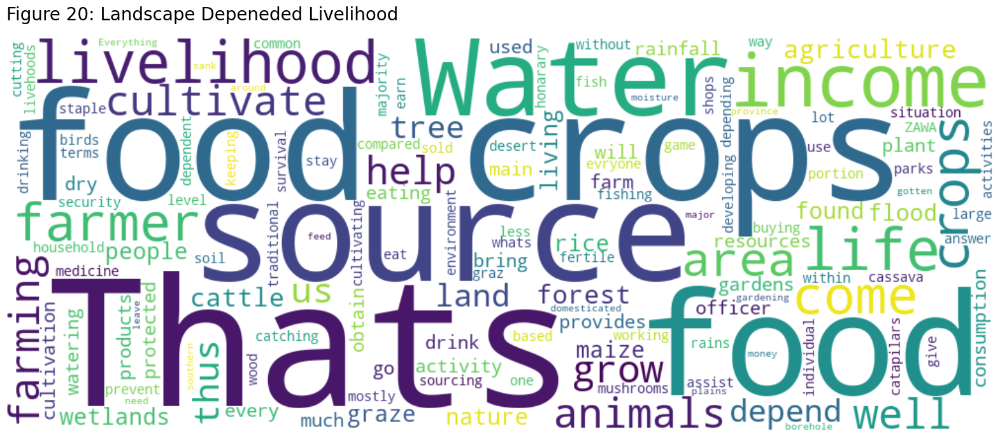

In [246]:
LDL_R1["Landscape_Depeneded_Livelihood_Reasons"] = LDL_R1["Landscape_Depeneded_Livelihood_Reasons"].fillna("")  
LDL_R1["Landscape_Depeneded_Livelihood_Reasons"] = LDL_R1["Landscape_Depeneded_Livelihood_Reasons"].astype(str)
LDL_R1_Text = " ".join(LDL_R1["Landscape_Depeneded_Livelihood_Reasons"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(LDL_R1_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Landscape Depeneded Livelihood", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

## 8.6 Explanation to Choices
 It gives an explanation to the choice selected that is not among the choices that were provided in the list of the questionnaire

In [247]:
df5=df2.drop(df2.columns[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30]], axis = 1)

In [248]:
df5

,Purpose_Landscape_Specific,Connection_Nature_Specific,Contributor_Landscape_Transformation_Specific,Landscape_Depended_Livelihood_Specific
0,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN
4,"Only the protection of nature, the others are not important",NaN,NaN,NaN
5,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN


In [249]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in df5.iterrows():
    PL_RS1_filter_sentence = []
    PL_RS1_sentence = row["Purpose_Landscape_Specific"]
    if pd.isnull(PL_RS1_sentence):
       continue
    PL_RS1_sentence_cleaned = re.sub(r'[^\w\s]','',PL_RS1_sentence)
    PL_RS1_words = nltk.word_tokenize(PL_RS1_sentence_cleaned)
    PL_RS1_words = [lemmatizer.lemmatize(w) for w in PL_RS1_words if w.lower() not in stop_words]
    PL_RS1_filter_sentence.extend(PL_RS1_words)
    print(PL_RS1_filter_sentence)

['protection', 'nature', 'others', 'important']
['fire', 'burn', 'biodiversity', 'allow', 'environmental', 'process']
['tourist', 'bring', 'income', 'term', 'viewing', 'animal']
['source', 'income', 'tourism']


In [250]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in df5.iterrows():
    CN_RS1_filter_sentence = []
    CN_RS1_sentence = row["Connection_Nature_Specific"]
    if pd.isnull(CN_RS1_sentence):
       continue
    CN_RS1_sentence_cleaned = re.sub(r'[^\w\s]','',CN_RS1_sentence)
    CN_RS1_words = nltk.word_tokenize(CN_RS1_sentence_cleaned)
    CN_RS1_words = [lemmatizer.lemmatize(w) for w in CN_RS1_words if w.lower() not in stop_words]
    CN_RS1_filter_sentence.extend(CN_RS1_words)
    print(CN_RS1_filter_sentence)

['Taking', 'care', 'nature', 'without', 'destroying']
['Taking', 'care', 'nature']
['Source', 'good', 'air', 'food', 'product']
['related']
['Protection', 'tree']
['Taking', 'care', 'animal']


In [251]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in df5.iterrows():
    CLT_RS1_filter_sentence = []
    CLT_RS1_sentence = row["Contributor_Landscape_Transformation_Specific"]
    if pd.isnull(CLT_RS1_sentence):
       continue
    CLT_RS1_sentence_cleaned = re.sub(r'[^\w\s]','',CLT_RS1_sentence)
    CLT_RS1_words = nltk.word_tokenize(CLT_RS1_sentence_cleaned)
    CLT_RS1_words = [lemmatizer.lemmatize(w) for w in CLT_RS1_words if w.lower() not in stop_words]
    CLT_RS1_filter_sentence.extend(CLT_RS1_words)
    print(CLT_RS1_filter_sentence)

['Cutting', 'tree', 'sale']


In [252]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in df5.iterrows():
    LDL_RS1_filter_sentence = []
    LDL_RS1_sentence = row["Landscape_Depended_Livelihood_Specific"]
    if pd.isnull(LDL_RS1_sentence):
       continue
    LDL_RS1_sentence_cleaned = re.sub(r'[^\w\s]','',LDL_RS1_sentence)
    LDL_RS1_words = nltk.word_tokenize(LDL_RS1_sentence_cleaned)
    LDL_RS1_words = [lemmatizer.lemmatize(w) for w in LDL_RS1_words if w.lower() not in stop_words]
    LDL_RS1_filter_sentence.extend(LDL_RS1_words)
    print(LDL_RS1_filter_sentence)

## 9. Description Statistics 
    It gives a background to the study sites

In [253]:
df6=df2.drop(df2.columns[[0,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)

In [254]:
df6

,Ward_Name,Sub_Project_name,Livelihood,Size,Name_Main_Project,Representing_Others,Number_Beneficiaries
0,Isamba ward,Isamba coperatives,Goat rearing,8to12Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many
1,Isamba ward,Misenga cooperative multipurpose society,"Goat rearing, Gardening, Fruit trees",Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many
2,Isamba ward,Ninge Cooperative,"Goat Rearing, Agricuture-cassava",Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many
3,Isamba ward,Twikatene copperatives,Goat rearing and Fish farming and garden of vegitable and onnoind,Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many
4,Isamba ward,Changwena women club,Chicken rearing ablnd an orchard,Lessthan4Lima_Size,TRALARD_LNM,yes,20to30People_Many
5,Isamba ward,Luchindashi copperative,Pig rearing and fish farming gardenning,Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many
6,Isamba ward,Sandwe Youth miitipurpose society,Pigery and garden and fish ponds,Greaterthan16Lima_Size,TRALARD_LNM,yes,30to40People_Many
7,Isamba ward,Lukatashi,Pigery and gardening as well as forestry,Greaterthan16Lima_Size,TRALARD_LNM,yes,30to40People_Many
8,Isamba ward,Kansalu coperative,Fish farming and chicken rearing,Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many
9,Isamba ward,Musaba coperative,"Chicken rearing and garden, oranges",Greaterthan16Lima_Size,TRALARD_LNM,yes,Greaterthan40People_Many


[<a href="#Purpose-of-the-Analysis">Back to top</a>]

### 9.1 Main project Types
    This shows the number of questionaires that were administered to each project type

In [255]:
MP = df6['Name_Main_Project'].value_counts(dropna=False)

In [256]:
MP

Name_Main_Project
SCRiKA_LS                               44
TRALARD_LNM                             40
SCRALA_SOUTHERN_WESTERN_NORTHEN         30
SCReBS_WESTERN                          15
Ecosystem Conservation_NORTH_WESTERN    11
PIN_WESTERN                              6
EbA_CENTRAL_MUCHINGA_LUAPULA             3
NaN                                      1
Name: count, dtype: int64

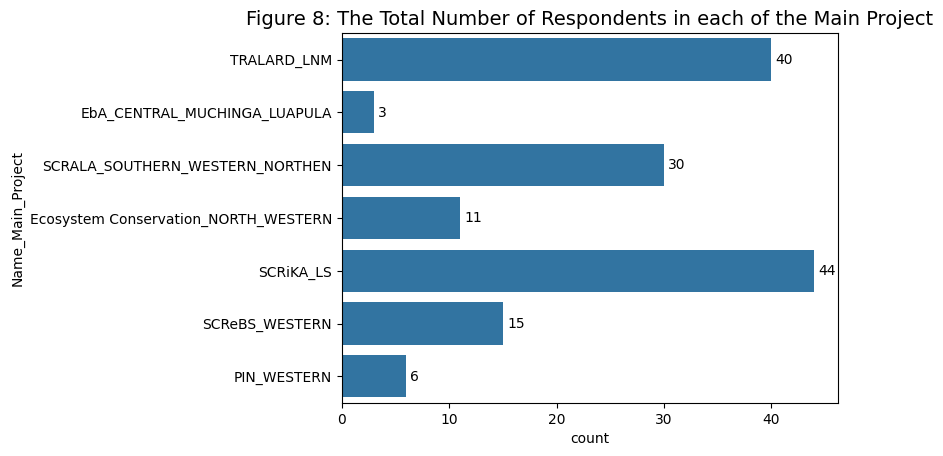

In [257]:
ax = sns.countplot(df6["Name_Main_Project"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 8: The Total Number of Respondents in each of the Main Project", fontsize=14)
plt.show()

### 9.2 The Wards
    The wards that had respodents and their number

In [258]:
WN = df6['Ward_Name'].value_counts(dropna=False)

In [259]:
WN

Ward_Name
Namwala Central ward    17
Omba ward               15
Mbila ward              14
Yeta ward               11
Mwanambuyu ward         11
Lulimala ward           11
Isamba ward             10
Kalobolelwa ward         9
Ntonga ward              8
Kalanga ward             8
Moofwe ward              7
Chitimbwa ward           7
Makuya ward              6
Nachikufu ward           5
Luubwe ward              4
Ntambu ward              4
NaN                      2
Silunga ward             1
Name: count, dtype: int64

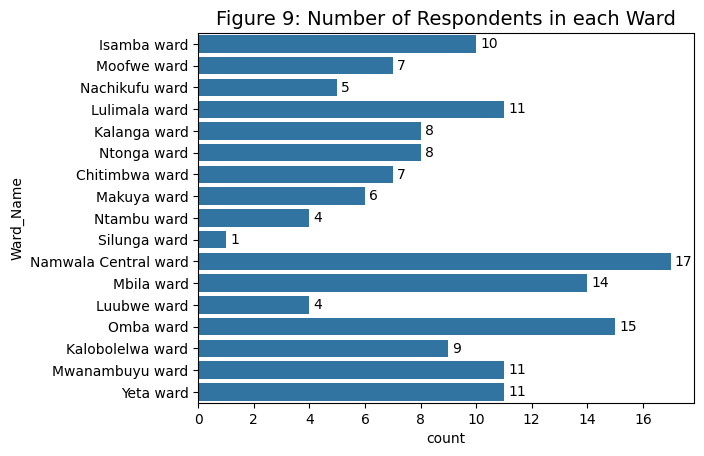

In [260]:
ax = sns.countplot(df6["Ward_Name"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 9: Number of Respondents in each Ward", fontsize=14)
plt.show()

### 9.3 Number of beneficiaries
    It shows the number of households that benefited from the interviewees

In [261]:
NB = df6['Number_Beneficiaries'].value_counts(dropna=False)

In [262]:
NB

Number_Beneficiaries
Greaterthan40People_Many    40
10to20People_Many           25
NaN                         25
20to30People_Many           24
30to40People_Many           23
Lessthan10People_Many       13
Name: count, dtype: int64

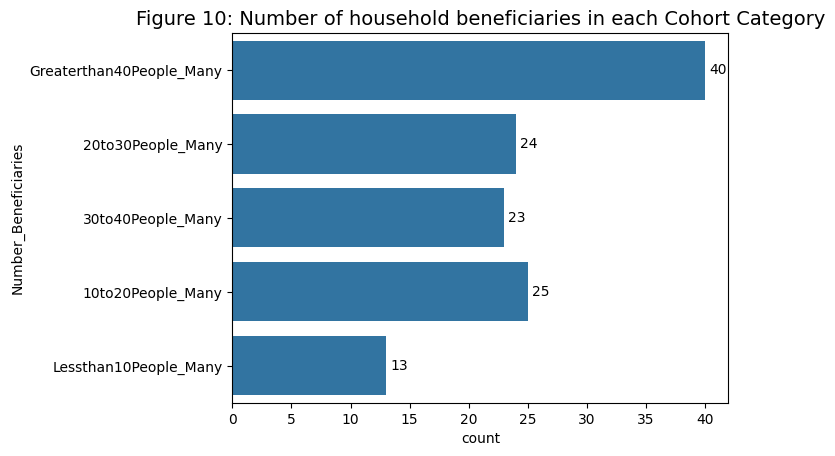

In [263]:
ax = sns.countplot(df6["Number_Beneficiaries"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 10: Number of household beneficiaries in each Cohort Category", fontsize=14)
plt.show()

### 9.4 Size of Landscape

In [264]:
SIZE = df6['Size'].value_counts(dropna=False)

In [265]:
SIZE

Size
Lessthan4Lima_Size        48
Greaterthan16Lima_Size    40
NotApplicable_Size        31
4to8Lima_Size             13
NaN                       10
8to12Lima_Size             5
12to16Lima_Size            3
Name: count, dtype: int64

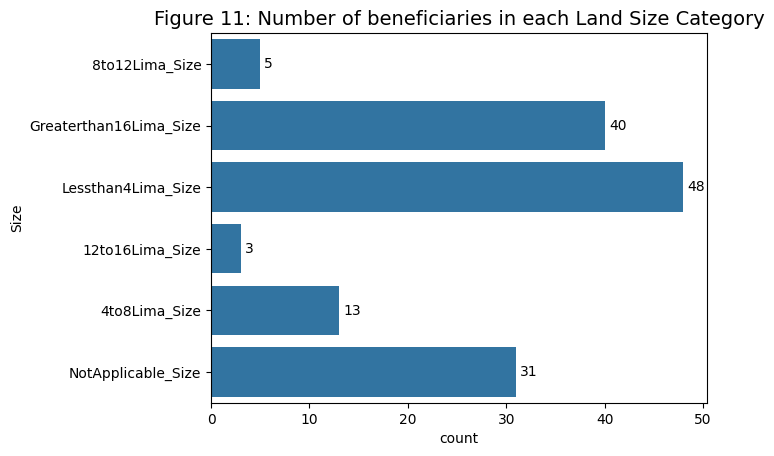

In [266]:
ax = sns.countplot(df6["Size"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 11: Number of beneficiaries in each Land Size Category", fontsize=14)
plt.show()

### 9.5 Represing Others
    It looks at those representing one house and more

In [267]:
RO = df6['Representing_Others'].value_counts(dropna=False)

In [268]:
RO

Representing_Others
yes    125
no      23
NaN      2
Name: count, dtype: int64

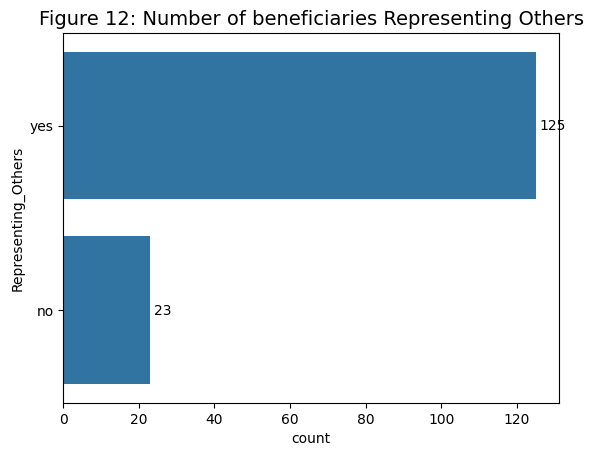

In [269]:
ax = sns.countplot(df6["Representing_Others"])
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
    ax.set_title("Figure 12: Number of beneficiaries Representing Others", fontsize=14)
plt.show()

[<a href="#Purpose-of-the-Analysis">Back to top</a>]

## 10. Reasons
The pandas dataframe depicts columns for the reasons to the responses to the likert scales

In [270]:
df7=df2.drop(df2.columns[[0,1,2,3,4,5,6,7,8,10,11,13,14,15,17,18,19,20,22,23,24,25,26,27,29,31,32,33,34]], axis = 1)

In [271]:
df7

,Cultural_Practices_Hinder_Reason,Cultural_Aspects_Considered_Reasons,Connection_Nature_Reasons,Change_Livelihood_Easy_Reasons,Contributor_Landscape_Transformation_Reasons,Landscape_Depeneded_Livelihood_Reasons
0,It has never happed before in his life time,There is no cultural history in the area,The animals can be used by the future generation as well,If the SES are taken care of they can increase in number and bring income,The trees have been depleted and it has caused reduced rainfall,He cultivates a large area of land so that some crops can be sold for a livelihood
1,There is need to harvest trees when they have fully grown the same applies to biodiversity,There is need to have power in what is being formulated so that there is ownership,How the animals can be used as an example on how people should lead their life,The SeS can be depleted thus there need to change to agriculture like goat rearing,Because i have to clear the land for agriculture to plant crops hence the landscape change,The catching of fish is the source of income in this area
2,There are no customary practices that hinder sustainable management,There are no cultural aspects,Through experiments he gains knowledge on the management of forest,Change is easier because he is the one who has decides to change,There would a reduction in the number of trees hence contributing to climate change,He depends much on agriculture the most than fish because the fish can be depleted
3,There are crop rotations made on the land when cultivating to ensure fertility of soil,At the time of getting the land for the project it comes with regulations,To use some of them for income,Because my livelihood would improve,Because it requires a huge land than the others like making charcoal,Food is the main source of livelihood thus without it there is no way to earn a living
4,There is nothing,We only follow what the chiefs and the government say,"They are important in our lifes like trees they provide home for animals as well as food. In addition, improve the soil texture",There has been things like climate change affecting us thus the thought to change,Because people cut down tree for farmimg but they never use the land but he would prefer they use a small portion to leave trees as a home of willd animals,The water is used for gardening and other things
5,There is nothing,There is nothing,There improvement in the sustainable management of forests,If there is new improvement like cooking stove we can change the way of livelihood,The agriculture activities involve cutting huge land,That is a source of income as well as food for consumption
6,There is nothing,There is nothing,They are a source of income and for the future generation to see them,There can be destruction of SES,The burning of charcoal give smoke that destroys the ozone layer as well as it brings acidic rains,The farming helps in sourcing of food
7,You are allowed to cultivate an area for 3 years before shifting to another area,"There are rules that along the river banks, the trees do not need to cut down",Source of income,There is need to change from cutting down to other activities,There are agriculture activities for food,That is a source of income
8,There is nothing,There is nothing,It is a source of income,There is need to change to activities that do not destroy the environment,There is no electricity thus a huge demand for energy,Thats a source of income
9,There is nothing,There is nothing,They should be kept for future generation to what is there,They can be changed through learning,It is for agriculture purposes that brings income,It is a source of livelihood


### 10.1 Reasons for Cultural Practices Hidering
     The reasons for cultural practices that hinder transfromation

In [272]:
lemmatizer = WordNetLemmatizer()
CPH = df7['Cultural_Practices_Hinder_Reason'].str.lower().str.cat(sep=' ')
CPH_words = nltk.tokenize.word_tokenize(CPH)
CPH_filtered_tokens = [word for word in CPH_words if len(CPH_words) >= 4]
CPH_lemmatized_words = [lemmatizer.lemmatize(word) for word in CPH_filtered_tokens]
CPH_token_counts = Counter(CPH_lemmatized_words)
CPH_columns = pd.DataFrame(CPH_token_counts.most_common(67),
columns = ['Word', 'Frequency'])
print(CPH_columns)

            Word  Frequency
0          there        104
1             is         94
2            the         74
3        nothing         74
4             to         35
5            are         26
6           that         25
7             of         25
8              a         20
9       practice         16
10          tree         15
11            ''         14
12           not         13
13   environment         12
14            no         11
15           and         11
16        people         11
17      cultural          9
18           but          9
19            it          8
20            in          8
21           for          8
22          from          8
23       protect          8
24          have          7
25     customary          7
26          land          7
27     community          7
28          down          7
29            do          7
30    management          6
31       cutting          6
32          such          6
33            ha          5
34          they    

In [273]:
lemmatizer = WordNetLemmatizer()
CAC = df7['Cultural_Aspects_Considered_Reasons'].str.lower().str.cat(sep=' ')
CAC_words = nltk.tokenize.word_tokenize(CAC)
CAC_filtered_tokens = [word for word in CAC_words if len(CAC_words) >= 4]
CAC_lemmatized_words = [lemmatizer.lemmatize(word) for word in CAC_filtered_tokens]
CAC_token_counts = Counter(CAC_lemmatized_words)
CAC_columns = pd.DataFrame(CAC_token_counts.most_common(67),
columns = ['Word', 'Frequency'])
print(CAC_columns)

           Word  Frequency
0           the         73
1           not         52
2            is         51
3            we         47
4         there         45
5       nothing         39
6            do         36
7            to         23
8           are         23
9            it         17
10      project         15
11         that         13
12           of         13
13     cultural         12
14         have         11
15          can         11
16     included         11
17         they         11
18           no         10
19           in         10
20            a         10
21      because         10
22  traditional          8
23       aspect          7
24       follow          7
25     practice          7
26          and          6
27           be          6
28           if          6
29          our          6
30          for          5
31         from          5
32      include          5
33   considered          5
34         what          4
35           so          4
3

In [274]:
lemmatizer = WordNetLemmatizer()
CoN = df7['Connection_Nature_Reasons'].str.lower().str.cat(sep=' ')
CoN_words = nltk.tokenize.word_tokenize(CoN)
CoN_filtered_tokens = [word for word in CoN_words if len(CoN_words) >= 4]
CoN_lemmatized_words = [lemmatizer.lemmatize(word) for word in CoN_filtered_tokens]
CoN_token_counts = Counter(CoN_lemmatized_words)
CoN_columns = pd.DataFrame(CoN_token_counts.most_common(67),
columns = ['Word', 'Frequency'])
print(CoN_columns)

          Word  Frequency
0            a         27
1           of         27
2          the         25
3         they         17
4       source         17
5       income         15
6           to         13
7          for         13
8          are         12
9           in         10
10        tree          9
11          is          8
12          we          8
13        them          7
14         and          7
15        well          6
16          it          6
17      animal          5
18         get          5
19           u          5
20        from          5
21      future          4
22          on          4
23           ,          4
24       there          4
25        help          4
26    instance          4
27     protect          4
28       bring          4
29         air          4
30         can          3
31          be          3
32  generation          3
33        lead          3
34        life          3
35     through          3
36  management          3
37        li

In [275]:
lemmatizer = WordNetLemmatizer()
CLE = df7['Change_Livelihood_Easy_Reasons'].str.lower().str.cat(sep=' ')
CLE_words = nltk.tokenize.word_tokenize(CLE)
CLE_filtered_tokens = [word for word in CLE_words if len(CLE_words) >= 4]
CLE_lemmatized_words = [lemmatizer.lemmatize(word) for word in CLE_filtered_tokens]
CLE_token_counts = Counter(CLE_lemmatized_words)
CLE_columns = pd.DataFrame(CLE_token_counts.most_common(67),
columns = ['Word', 'Frequency'])
print(CLE_columns)

           Word  Frequency
0           the         76
1            we         68
2            to         65
3             a         62
4            is         59
5        change         53
6            it         38
7           are         35
8           can         31
9          have         31
10        there         30
11          not         29
12   livelihood         28
13         that         28
14           of         27
15          and         23
16           on         21
17      because         20
18           if         19
19            i         18
20           in         17
21         thus         17
22          for         17
23         long         16
24         from         15
25           do         15
26          our         14
27           be         13
28     resource         13
29          use         12
30      natural         11
31       depend         11
32    difficult         11
33      climate         10
34            u         10
35          you         10
3

In [276]:
lemmatizer = WordNetLemmatizer()
CLT = df7['Contributor_Landscape_Transformation_Reasons'].str.lower().str.cat(sep=' ')
CLT_words = nltk.tokenize.word_tokenize(CLT)
CLT_filtered_tokens = [word for word in CLT_words if len(CLT_words) >= 4]
CLT_lemmatized_words = [lemmatizer.lemmatize(word) for word in CLT_filtered_tokens]
CLT_token_counts = Counter(CLT_lemmatized_words)
CLT_columns = pd.DataFrame(CLT_token_counts.most_common(67),
columns = ['Word', 'Frequency'])
print(CLT_columns)

            Word  Frequency
0            the        144
1             of         56
2              a         54
3           tree         47
4             it         41
5            for         40
6             to         35
7             is         33
8            are         31
9            and         26
10      destroys         24
11          that         20
12        animal         19
13       cutting         18
14          land         16
15      charcoal         16
16         there         15
17       burning         15
18           cut         14
19            we         14
20          fire         14
21            in         13
22          when         13
23          huge         12
24        people         12
25          they         12
26          burn         12
27            on         12
28       because         11
29             ,         11
30          area         11
31          have         10
32   agriculture         10
33          down         10
34          food    

In [277]:
lemmatizer = WordNetLemmatizer()
LDL = df7['Landscape_Depeneded_Livelihood_Reasons'].str.lower().str.cat(sep=' ')
LDL_words = nltk.tokenize.word_tokenize(LDL)
LDL_filtered_tokens = [word for word in LDL_words if len(LDL_words) >= 4]
LDL_lemmatized_words = [lemmatizer.lemmatize(word) for word in LDL_filtered_tokens]
LDL_token_counts = Counter(LDL_lemmatized_words)
LDL_columns = pd.DataFrame(LDL_token_counts.most_common(67),
columns = ['Word', 'Frequency'])
print(LDL_columns)

           Word  Frequency
0            we         63
1            is         54
2          food         51
3             a         46
4           the         43
5          crop         38
6         thats         38
7         where         37
8            of         34
9           our         33
10          get         29
11          for         28
12       source         25
13          and         25
14         that         24
15        water         23
16         from         23
17          are         22
18         were         21
19           it         20
20       income         18
21           in         16
22         life         16
23   livelihood         15
24         come         13
25       farmer         12
26         area         10
27           to         10
28       animal          9
29           on          8
30         well          8
31        there          7
32      farming          7
33       forest          7
34          can          6
35           be          6
3

[<a href="#Purpose-of-the-Analysis">Back to top</a>]

## 11. Specific Variables

### 11.1 Main Project and Cultural Practices
The responses are grouped in line with the main projects
There is also the grouping of responses of those that agreed and storngly agreed in one dataframe as well as those whose responses were strongly disagreed and disagreed  
The text responses in form of reasons are tokenized and lammentized  

In [278]:
CPH_grouped = df2.groupby('Name_Main_Project')['Cultural_Practices_Hinder'].value_counts(dropna=False)

In [279]:
CPH_grouped

Name_Main_Project                     Cultural_Practices_Hinder
EbA_CENTRAL_MUCHINGA_LUAPULA          Strongly_Agree_Likert         2
                                      Strongly_Disagree_Likert      1
Ecosystem Conservation_NORTH_WESTERN  Strongly_Disagree_Likert      5
                                      Strongly_Agree_Likert         2
                                      NaN                           2
                                      Agree_Likert                  1
                                      Disagree_Likert               1
PIN_WESTERN                           Strongly_Disagree_Likert      5
                                      NaN                           1
SCRALA_SOUTHERN_WESTERN_NORTHEN       Disagree_Likert              11
                                      Strongly_Disagree_Likert      9
                                      Agree_Likert                  5
                                      Strongly_Agree_Likert         2
                          

In [280]:
CPH_grouped1 = pd.DataFrame(CPH_grouped)

In [281]:
CPH_grouped1

count
Name_Main_Project                    Cultural_Practices_Hinder       
EbA_CENTRAL_MUCHINGA_LUAPULA         Strongly_Agree_Likert          2
                                     Strongly_Disagree_Likert       1
Ecosystem Conservation_NORTH_WESTERN Strongly_Disagree_Likert       5
                                     Strongly_Agree_Likert          2
                                     NaN                            2
                                     Agree_Likert                   1
                                     Disagree_Likert                1
PIN_WESTERN                          Strongly_Disagree_Likert       5
                                     NaN                            1
SCRALA_SOUTHERN_WESTERN_NORTHEN      Disagree_Likert               11
                                     Strongly_Disagree_Likert       9
                                     Agree_Likert                   5
                                     Strongly_Agree_Likert          2
                                     Undecided_Likert               2
                                     NaN                            1
SCReBS_WESTERN                       Strongly_Disagree_Likert      14
                                     Agree_Likert                   1
SCRiKA_LS                            Strongly_Disagree_Likert      20
                                     Disagree_Likert                6
                                     NaN                            6
                                     Agree_Likert                   5
                                     Strongly_Agree_Likert          5
                                     Undecided_Likert               2
TRALARD_LNM                          Strongly_Disagree_Likert      16
                                     Strongly_Agree_Likert         10
                                     Agree_Likert                   8
                                     Disagree_Likert                4
                                     NaN                            2

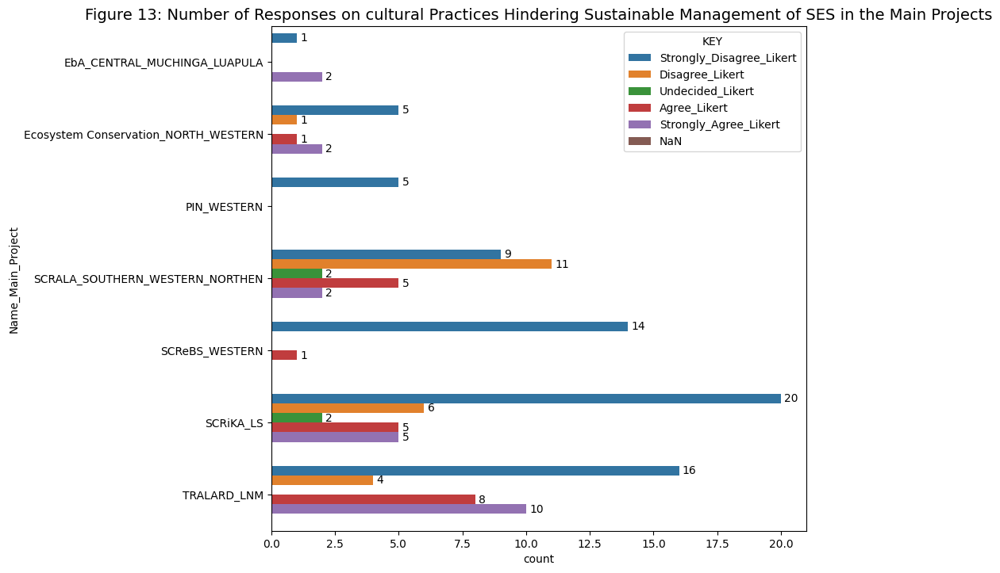

In [282]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert", "NaN"]
ax = sns.barplot(data = CPH_grouped1, x="count", y="Name_Main_Project", hue="Cultural_Practices_Hinder", hue_order=hue_order, legend=True)
ax.set_title("Figure 13: Number of Responses on cultural Practices Hindering Sustainable Management of SES in the Main Projects", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

In [283]:
agreement_levels = ["Agree_Likert", "Strongly_Agree_Likert"]
CPH_R = df2[df2["Cultural_Practices_Hinder"].isin(agreement_levels)]

In [284]:
CPH_R1 = CPH_R.drop(CPH_R.columns[[0,1,2,3,4,6,7,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)
CPH_R1grouped = CPH_R1.groupby('Name_Main_Project')['Cultural_Practices_Hinder']
CPH_R1

,Name_Main_Project,Cultural_Practices_Hinder,Cultural_Practices_Hinder_Reason
1,TRALARD_LNM,Strongly_Agree_Likert,There is need to harvest trees when they have fully grown the same applies to biodiversity
3,TRALARD_LNM,Strongly_Agree_Likert,There are crop rotations made on the land when cultivating to ensure fertility of soil
7,TRALARD_LNM,Strongly_Agree_Likert,You are allowed to cultivate an area for 3 years before shifting to another area
11,TRALARD_LNM,Strongly_Agree_Likert,There are rules from the chiefs who ensure that harvesting period is followed as well as the period of burning the bush
12,TRALARD_LNM,Strongly_Agree_Likert,There is a norm that the bush should be burned when it is not very dry so that the bush does not completely burn and also to support quick regermination of vegetation and trees
17,TRALARD_LNM,Strongly_Agree_Likert,There is nothing
19,TRALARD_LNM,Strongly_Agree_Likert,He has never heard of that or learnt about it
22,TRALARD_LNM,Strongly_Agree_Likert,The cutting down of trees along the river is not allowed
23,EbA_CENTRAL_MUCHINGA_LUAPULA,Strongly_Agree_Likert,There acts of late burning that destroys the environment as the people in the communities would want to catch Catapilars for consumption or sale
24,TRALARD_LNM,Agree_Likert,Because a long time ago people had poor management of natural but at the moment there are practice to maintain biodiversity


In [285]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CPH_R1.iterrows():
    CPH_R1_filter_sentence = []
    CPH_R1_sentence = row["Cultural_Practices_Hinder_Reason"]
    if pd.isnull(CPH_R1_sentence):
       continue
    CPH_R1_sentence_cleaned = re.sub(r'[^\w\s]','',CPH_R1_sentence)
    CPH_R1_words = nltk.word_tokenize(CPH_R1_sentence_cleaned)
    CPH_R1_words = [lemmatizer.lemmatize(w) for w in CPH_R1_words if w.lower() not in stop_words]
    CPH_R1_filter_sentence.extend(CPH_R1_words)
    print(CPH_R1_filter_sentence)

['need', 'harvest', 'tree', 'fully', 'grown', 'applies', 'biodiversity']
['crop', 'rotation', 'made', 'land', 'cultivating', 'ensure', 'fertility', 'soil']
['allowed', 'cultivate', 'area', '3', 'year', 'shifting', 'another', 'area']
['rule', 'chief', 'ensure', 'harvesting', 'period', 'followed', 'well', 'period', 'burning', 'bush']
['norm', 'bush', 'burned', 'dry', 'bush', 'completely', 'burn', 'also', 'support', 'quick', 'regermination', 'vegetation', 'tree']
['nothing']
['never', 'heard', 'learnt']
['cutting', 'tree', 'along', 'river', 'allowed']
['act', 'late', 'burning', 'destroys', 'environment', 'people', 'community', 'would', 'want', 'catch', 'Catapilars', 'consumption', 'sale']
['long', 'time', 'ago', 'people', 'poor', 'management', 'natural', 'moment', 'practice', 'maintain', 'biodiversity']
['cultural', 'practice', 'future', 'generation', 'know', 'anything']
['customary', 'practice', 'promote', 'early', 'burning', 'people', 'tend', 'burn', 'late']
['unregulated', 'allocation'

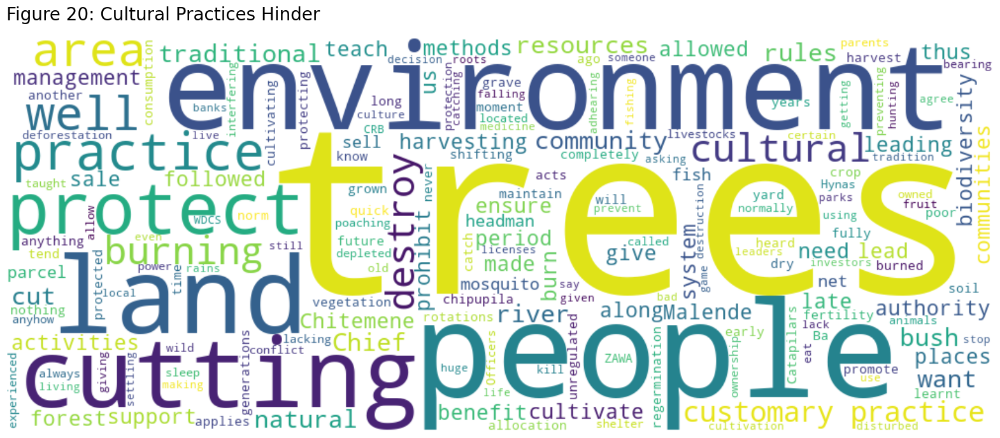

In [286]:
CPH_R1["Cultural_Practices_Hinder_Reason"] = CPH_R1["Cultural_Practices_Hinder_Reason"].fillna("")  
CPH_R1["Cultural_Practices_Hinder_Reason"] = CPH_R1["Cultural_Practices_Hinder_Reason"].astype(str)
CPH_R1_Text = " ".join(CPH_R1["Cultural_Practices_Hinder_Reason"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CPH_R1_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Cultural Practices Hinder", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

In [287]:
agreement_levels = ["Disagree_Likert", "Strongly_Disagree_Likert"]
CPH_R2 = df2[df2["Cultural_Practices_Hinder"].isin(agreement_levels)]

In [288]:
CPH_R3 = CPH_R2.drop(CPH_R2.columns[[0,1,2,3,4,6,7,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)
CPH_R3grouped = CPH_R3.groupby('Name_Main_Project')['Cultural_Practices_Hinder']
CPH_R3

,Name_Main_Project,Cultural_Practices_Hinder,Cultural_Practices_Hinder_Reason
0,TRALARD_LNM,Disagree_Likert,It has never happed before in his life time
2,TRALARD_LNM,Strongly_Disagree_Likert,There are no customary practices that hinder sustainable management
4,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
5,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
6,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
8,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
9,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
10,TRALARD_LNM,Strongly_Disagree_Likert,There is no cultural history within the community except from the governmnet
13,TRALARD_LNM,Strongly_Disagree_Likert,There are no cultural norms
14,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing


In [289]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CPH_R3.iterrows():
    CPH_R3_filter_sentence = []
    CPH_R3_sentence = row["Cultural_Practices_Hinder_Reason"]
    if pd.isnull(CPH_R3_sentence):
       continue
    CPH_R3_sentence_cleaned = re.sub(r'[^\w\s]','',CPH_R3_sentence)
    CPH_R3_words = nltk.word_tokenize(CPH_R3_sentence_cleaned)
    CPH_R3_words = [lemmatizer.lemmatize(w) for w in CPH_R3_words if w.lower() not in stop_words]
    CPH_R3_filter_sentence.extend(CPH_R3_words)
    print(CPH_R3_filter_sentence)

['never', 'happed', 'life', 'time']
['customary', 'practice', 'hinder', 'sustainable', 'management']
['nothing']
['nothing']
['nothing']
['nothing']
['nothing']
['cultural', 'history', 'within', 'community', 'except', 'governmnet']
['cultural', 'norm']
['nothing']
['nothing']
['nothing']
['customary', 'practice', 'protect', 'environment', 'like', 'way', 'ZAWA', 'protects', 'biodiversity']
['chitemene', 'system', 'customary', 'practice', 'destroys', 'environment']
['cultural', 'practice', 'burn', 'bush', 'certain', 'period', 'harvesting']
['cultural', 'practice']
['nothing']
['nothing']
['nothing']
['nothing']
['nothing']
['nothing']
['nothing']
['nothing']
['nothinhg']
['traditional', 'practice', 'government', 'guide', 'u']
['nothing']
['nothing']
['nothing', 'SES', 'looked', 'game', 'park', 'officer', 'officer', 'mandated']
['nothing']
['nothing']
['nothing']
['nothing']
['nothing']
['nothing']
['traditional', 'way', 'management', 'stopped', 'government', 'taken', 'management', 'fores

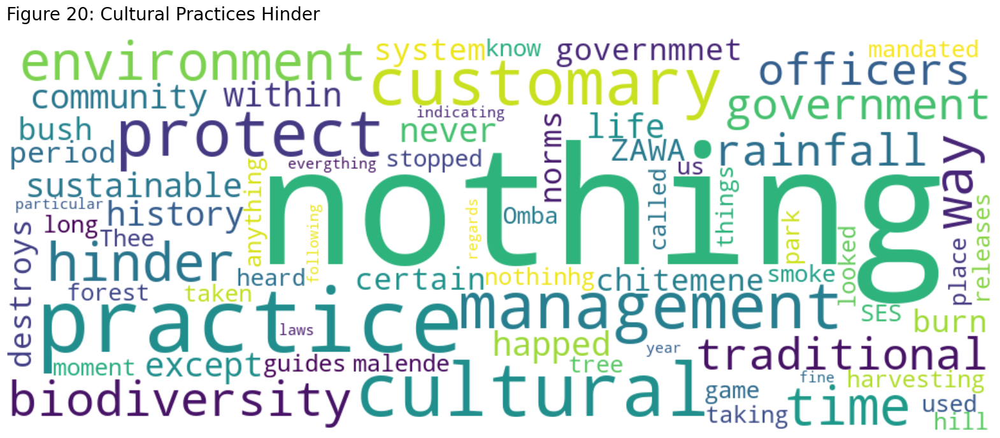

In [290]:
CPH_R3["Cultural_Practices_Hinder_Reason"] = CPH_R3["Cultural_Practices_Hinder_Reason"].fillna("")  
CPH_R3["Cultural_Practices_Hinder_Reason"] = CPH_R3["Cultural_Practices_Hinder_Reason"].astype(str)
CPH_R3_Text = " ".join(CPH_R3["Cultural_Practices_Hinder_Reason"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CPH_R3_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Cultural Practices Hinder", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

### 11.2 Main Project and Cultural Practices Changed

In [291]:
CPC_grouped = df2.groupby('Name_Main_Project')['Cultural_Practices_Changed'].value_counts(dropna=False)

In [292]:
CPC_grouped

Name_Main_Project                     Cultural_Practices_Changed
EbA_CENTRAL_MUCHINGA_LUAPULA          Strongly_Agree_Likert          1
                                      Strongly_Disagree_Likert       1
                                      Undecided_Likert               1
Ecosystem Conservation_NORTH_WESTERN  NaN                            5
                                      Strongly_Agree_Likert          4
                                      Strongly_Disagree_Likert       2
PIN_WESTERN                           Strongly_Disagree_Likert       4
                                      Strongly_Agree_Likert          1
                                      NaN                            1
SCRALA_SOUTHERN_WESTERN_NORTHEN       Agree_Likert                  11
                                      Disagree_Likert                7
                                      Strongly_Disagree_Likert       4
                                      Undecided_Likert               4
            

In [293]:
CPC_grouped1 = pd.DataFrame(CPC_grouped)

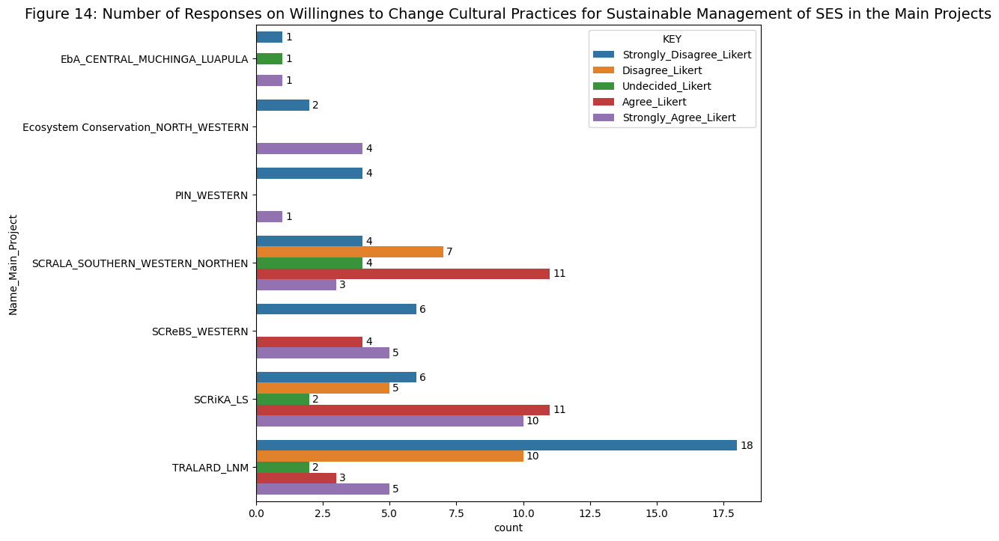

In [294]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = CPC_grouped1, x="count", y="Name_Main_Project", hue="Cultural_Practices_Changed", hue_order=hue_order, legend=True)
ax.set_title("Figure 14: Number of Responses on Willingnes to Change Cultural Practices for Sustainable Management of SES in the Main Projects", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.3 Main project and Cultural Aspects Considered

In [295]:
CAC_grouped = df2.groupby('Name_Main_Project')['Cultural_Aspects_Considered'].value_counts(dropna=False)

In [296]:
CAC_grouped1 = pd.DataFrame(CAC_grouped)

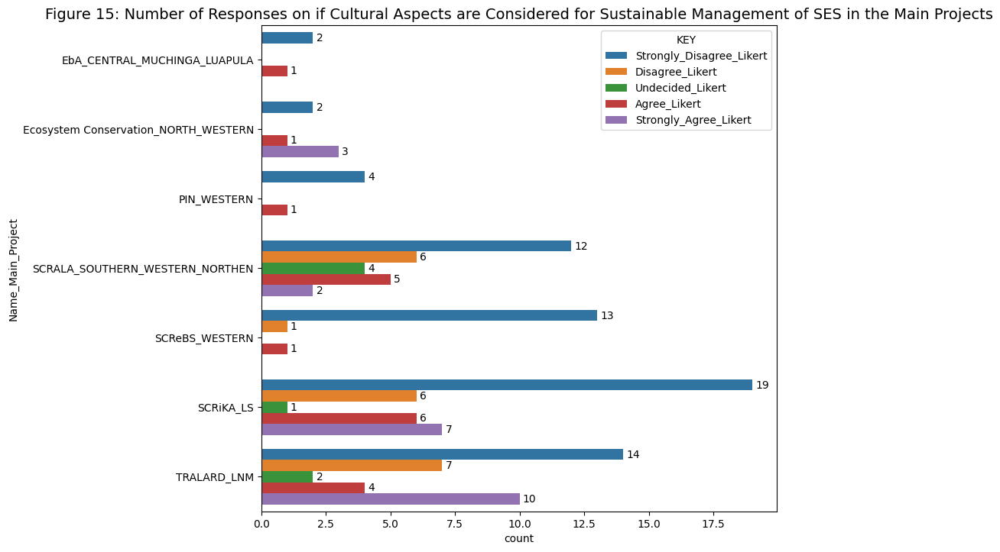

In [297]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = CAC_grouped1, x="count", y="Name_Main_Project", hue="Cultural_Aspects_Considered", hue_order=hue_order, legend=True)
ax.set_title("Figure 15: Number of Responses on if Cultural Aspects are Considered for Sustainable Management of SES in the Main Projects", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

In [298]:
agreement_levels = ["Agree_Likert", "Strongly_Agree_Likert"]
CAC_R = df2[df2["Cultural_Aspects_Considered"].isin(agreement_levels)]
CAC_R1 = CAC_R.drop(CPH_R.columns[[0,1,2,3,4,6,7,8,9,10,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)
CAC_R1grouped = CAC_R1.groupby('Name_Main_Project')['Cultural_Aspects_Considered']
CAC_R1

,Name_Main_Project,Cultural_Aspects_Considered,Cultural_Aspects_Considered_Reasons
1,TRALARD_LNM,Strongly_Agree_Likert,There is need to have power in what is being formulated so that there is ownership
3,TRALARD_LNM,Strongly_Agree_Likert,At the time of getting the land for the project it comes with regulations
7,TRALARD_LNM,Strongly_Agree_Likert,"There are rules that along the river banks, the trees do not need to cut down"
11,TRALARD_LNM,Strongly_Agree_Likert,There are sometimes we have to give the Chiefs from the harvest that we collect or produce that has to be accounted for
17,TRALARD_LNM,Strongly_Agree_Likert,There is nothing because those things ended a long time ago and the Chiefs would talk to the spirits to protect the land
21,TRALARD_LNM,Strongly_Agree_Likert,They are not included
22,TRALARD_LNM,Strongly_Agree_Likert,If there are no customary practices the natural resources can get destroyed
23,EbA_CENTRAL_MUCHINGA_LUAPULA,Agree_Likert,No answer
24,TRALARD_LNM,Agree_Likert,No answer
25,TRALARD_LNM,Agree_Likert,If it is not done the product or project will not work well


In [299]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CAC_R1.iterrows():
    CAC_R1_filter_sentence = []
    CAC_R1_sentence = row["Cultural_Aspects_Considered_Reasons"]
    if pd.isnull(CAC_R1_sentence):
       continue
    CAC_R1_sentence_cleaned = re.sub(r'[^\w\s]','',CAC_R1_sentence)
    CAC_R1_words = nltk.word_tokenize(CAC_R1_sentence_cleaned)
    CAC_R1_words = [lemmatizer.lemmatize(w) for w in CAC_R1_words if w.lower() not in stop_words]
    CAC_R1_filter_sentence.extend(CAC_R1_words)
    print(CAC_R1_filter_sentence)

['need', 'power', 'formulated', 'ownership']
['time', 'getting', 'land', 'project', 'come', 'regulation']
['rule', 'along', 'river', 'bank', 'tree', 'need', 'cut']
['sometimes', 'give', 'Chiefs', 'harvest', 'collect', 'produce', 'accounted']
['nothing', 'thing', 'ended', 'long', 'time', 'ago', 'Chiefs', 'would', 'talk', 'spirit', 'protect', 'land']
['included']
['customary', 'practice', 'natural', 'resource', 'get', 'destroyed']
['answer']
['answer']
['done', 'product', 'project', 'work', 'well']
['follow', 'customary', 'practice', 'people', 'burn', 'late', 'inorder']
['livelihood', 'improve']
['follow', 'historical', 'practice', 'forefather']
['cultural', 'practice', 'spririal', 'rite', 'done', 'traditional', 'authority']
['accessing', 'land', 'traditional', 'authority', 'also', 'give', 'instruction', 'put', 'livelihood', 'close', 'water', 'source', 'resource']
['project', 'operate', 'without', 'consulting', 'traditional', 'authority']
['answer']
['Sometimes', 'discus', 'locally', 'an

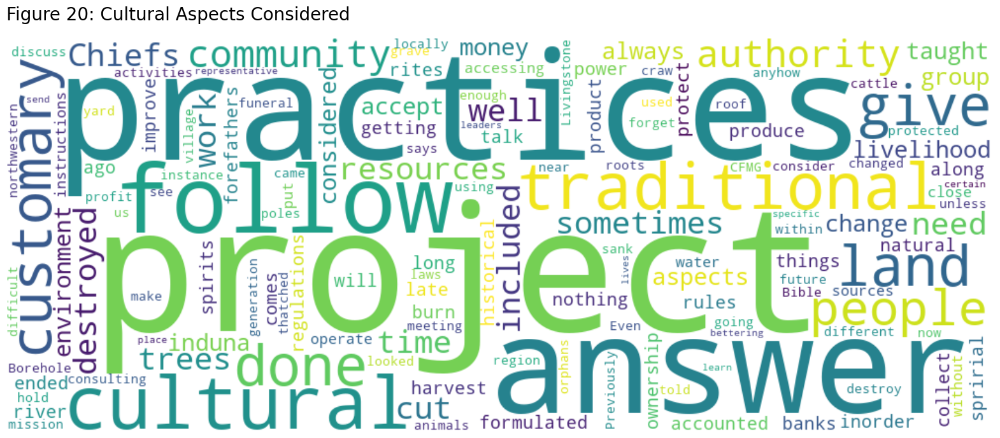

In [300]:
CAC_R1["Cultural_Aspects_Considered_Reasons"] = CAC_R1["Cultural_Aspects_Considered_Reasons"].fillna("")  
CAC_R1["Cultural_Aspects_Considered_Reasons"] = CAC_R1["Cultural_Aspects_Considered_Reasons"].astype(str)
CAC_R1_Text = " ".join(CAC_R1["Cultural_Aspects_Considered_Reasons"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CAC_R1_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Cultural Aspects Considered", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

In [301]:
agreement_levels = ["Disagree_Likert", "Strongly_Disagree_Likert"]
CAC_R2 = df2[df2["Cultural_Aspects_Considered"].isin(agreement_levels)]
CAC_R3 = CAC_R2.drop(CPH_R2.columns[[0,1,2,3,4,6,7,8,9,10,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)
CAC_R3grouped = CAC_R3.groupby('Name_Main_Project')['Cultural_Aspects_Considered']
CAC_R3

,Name_Main_Project,Cultural_Aspects_Considered,Cultural_Aspects_Considered_Reasons
0,TRALARD_LNM,Strongly_Disagree_Likert,There is no cultural history in the area
2,TRALARD_LNM,Strongly_Disagree_Likert,There are no cultural aspects
4,TRALARD_LNM,Strongly_Disagree_Likert,We only follow what the chiefs and the government say
5,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
6,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
8,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
9,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
10,TRALARD_LNM,Strongly_Disagree_Likert,The plans were just given to us by TRALARD so there was no consideration of cultural history when formulating the projects
12,TRALARD_LNM,Strongly_Disagree_Likert,There is nothing
13,TRALARD_LNM,Strongly_Disagree_Likert,At the moment we follow the laws of the government and not cultural norms


In [302]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CAC_R3.iterrows():
    CAC_R3_filter_sentence = []
    CAC_R3_sentence = row["Cultural_Aspects_Considered_Reasons"]
    if pd.isnull(CAC_R3_sentence):
       continue
    CAC_R3_sentence_cleaned = re.sub(r'[^\w\s]','',CAC_R3_sentence)
    CAC_R3_words = nltk.word_tokenize(CAC_R3_sentence_cleaned)
    CAC_R3_words = [lemmatizer.lemmatize(w) for w in CAC_R3_words if w.lower() not in stop_words]
    CAC_R3_filter_sentence.extend(CAC_R3_words)
    print(CAC_R3_filter_sentence)

['cultural', 'history', 'area']
['cultural', 'aspect']
['follow', 'chief', 'government', 'say']
['nothing']
['nothing']
['nothing']
['nothing']
['plan', 'given', 'u', 'TRALARD', 'consideration', 'cultural', 'history', 'formulating', 'project']
['nothing']
['moment', 'follow', 'law', 'government', 'cultural', 'norm']
['nothing']
['ask', 'headman', 'give', 'u', 'place', 'keep', 'goat', 'place', 'acceptable', 'traditional', 'law']
['nothing', 'moment', 'traditional', 'leader', 'spritual', 'activity', 'project']
['include', 'cultural', 'practice']
['project', 'move', 'well', 'headman', 'project', 'otherwise', 'included', 'might', 'problem']
['available']
['consider']
['nothing']
['nothing']
[]
['nothing']
[]
['unneccesary']
['anything']
[]
['nothing']
['include']
[]
['nothing']
['include', 'aspect']
['nothing']
['nothing', 'included']
['Nothing', 'considered']
['nothing']
[]
['Nothing', 'considered']
['nothing']
['included']
['include']
['nothing', 'included']
['nothing']
['included']
['No

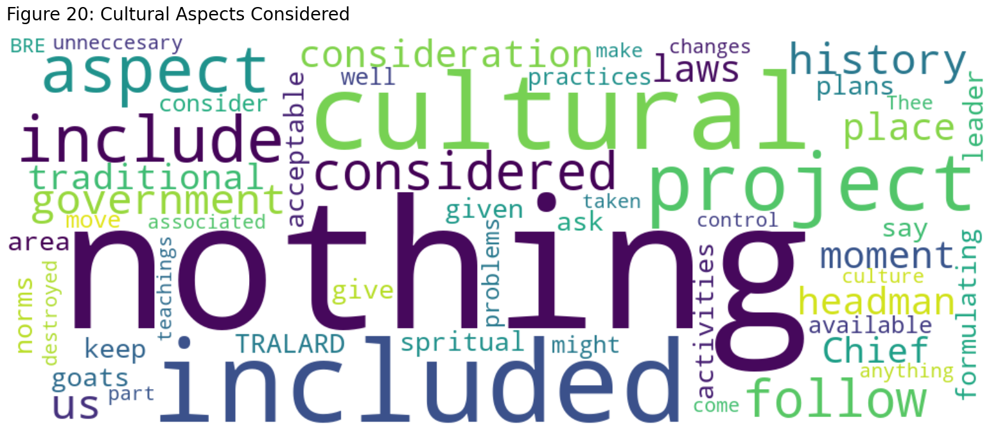

In [303]:
CAC_R3["Cultural_Aspects_Considered_Reasons"] = CAC_R3["Cultural_Aspects_Considered_Reasons"].fillna("")  
CAC_R3["Cultural_Aspects_Considered_Reasons"] = CAC_R3["Cultural_Aspects_Considered_Reasons"].astype(str)
CAC_R3_Text = " ".join(CAC_R3["Cultural_Aspects_Considered_Reasons"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CAC_R3_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Cultural Aspects Considered", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

### 11.4 Main Project and Measure of Indicators

In [304]:
MI_grouped = df2.groupby('Name_Main_Project')['Measure_Indicators'].value_counts(dropna=False)

In [305]:
MI_grouped1 = pd.DataFrame(MI_grouped)

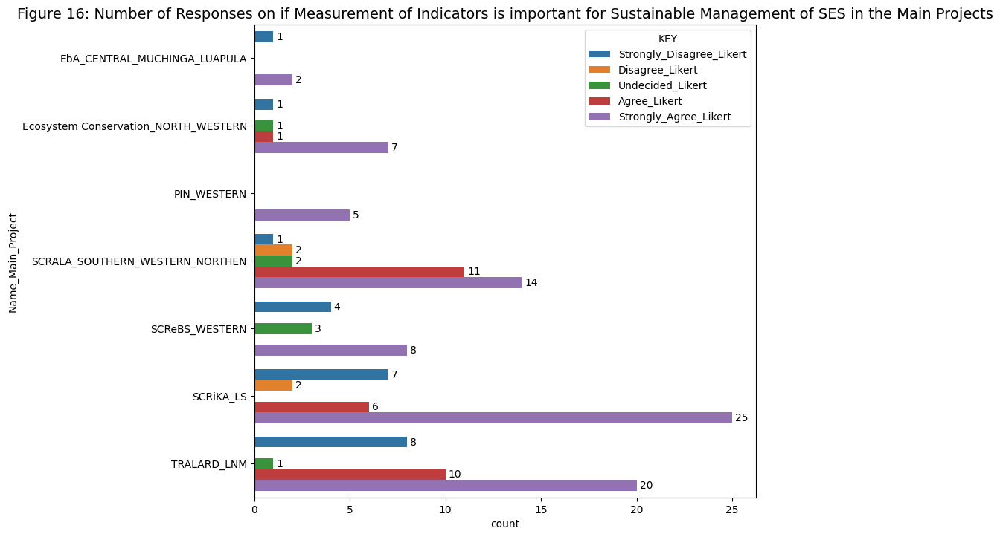

In [306]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = MI_grouped1, x="count", y="Name_Main_Project", hue="Measure_Indicators", hue_order=hue_order, legend=True)
ax.set_title("Figure 16: Number of Responses on if Measurement of Indicators is important for Sustainable Management of SES in the Main Projects", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.5 Main Project and Livelihood Dependent

In [307]:
LD_grouped = df2.groupby('Name_Main_Project')['Livilihood_Depenedent'].value_counts(dropna=False)

In [308]:
LD_grouped1 = pd.DataFrame(LD_grouped)

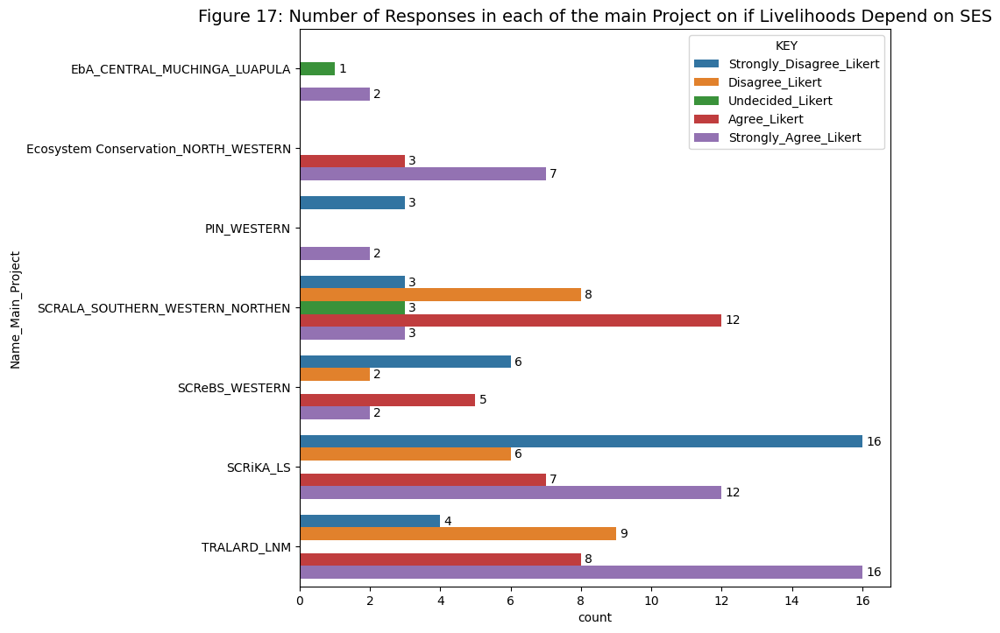

In [309]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = LD_grouped1, x="count", y="Name_Main_Project", hue="Livilihood_Depenedent", hue_order=hue_order, legend=True)
ax.set_title("Figure 17: Number of Responses in each of the main Project on if Livelihoods Depend on SES", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.6 Main Project and Livelihood Changed

In [310]:
CL_grouped = df2.groupby('Name_Main_Project')['Change_Livelihood'].value_counts(dropna=False)

In [311]:
CL_grouped1 = pd.DataFrame(CL_grouped)

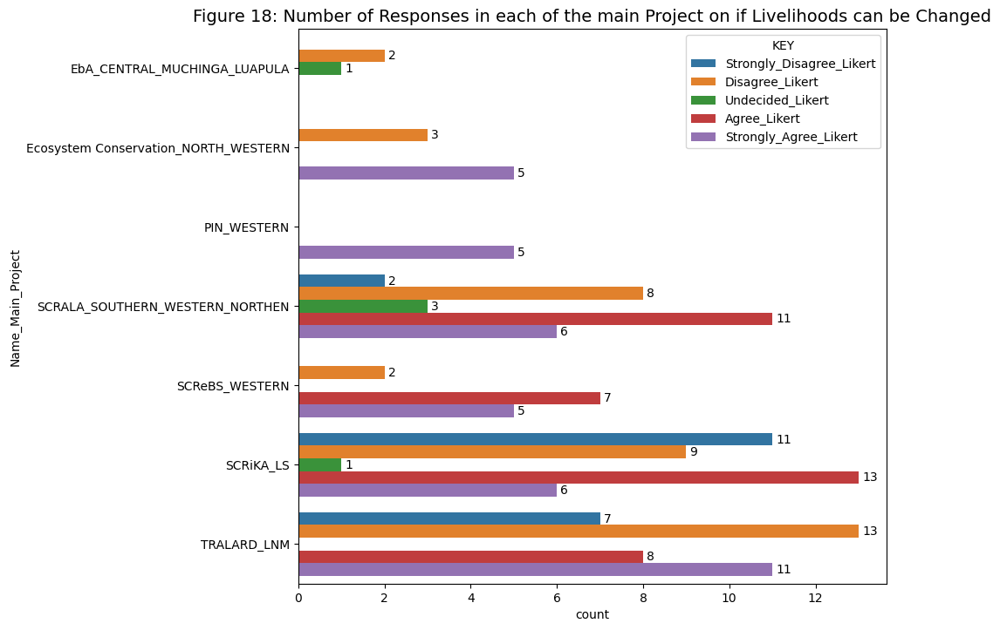

In [312]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = CL_grouped1, x="count", y="Name_Main_Project", hue="Change_Livelihood", hue_order=hue_order, legend=True)
ax.set_title("Figure 18: Number of Responses in each of the main Project on if Livelihoods can be Changed", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.7 Main Project and Livelihood Changing Easy

In [313]:
CLE_grouped = df2.groupby('Name_Main_Project')['Change_Livelihood_Easy'].value_counts(dropna=False)

In [314]:
CLE_grouped1 = pd.DataFrame(CLE_grouped)

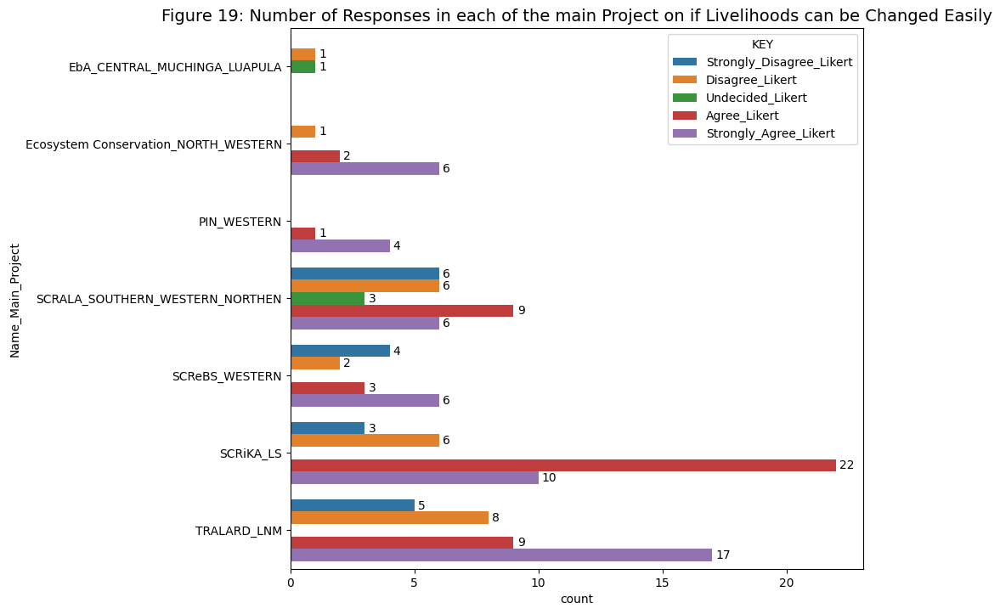

In [315]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = CLE_grouped1, x="count", y="Name_Main_Project", hue="Change_Livelihood_Easy", hue_order=hue_order, legend=True)
ax.set_title("Figure 19: Number of Responses in each of the main Project on if Livelihoods can be Changed Easily", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

In [316]:
agreement_levels = ["Agree_Likert", "Strongly_Agree_Likert"]
CLE_R = df2[df2["Change_Livelihood_Easy"].isin(agreement_levels)]
CLE_R1 = CLE_R.drop(CLE_R.columns[[0,1,2,3,4,6,7,8,9,10,11,12,13,14,15,16,17,18,19,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)
CLE_R1grouped = CLE_R1.groupby('Name_Main_Project')['Change_Livelihood_Easy']
CLE_R1

,Name_Main_Project,Change_Livelihood_Easy,Change_Livelihood_Easy_Reasons
0,TRALARD_LNM,Strongly_Agree_Likert,If the SES are taken care of they can increase in number and bring income
1,TRALARD_LNM,Strongly_Agree_Likert,The SeS can be depleted thus there need to change to agriculture like goat rearing
2,TRALARD_LNM,Agree_Likert,Change is easier because he is the one who has decides to change
4,TRALARD_LNM,Strongly_Agree_Likert,There has been things like climate change affecting us thus the thought to change
5,TRALARD_LNM,Strongly_Agree_Likert,If there is new improvement like cooking stove we can change the way of livelihood
6,TRALARD_LNM,Strongly_Agree_Likert,There can be destruction of SES
7,TRALARD_LNM,Strongly_Agree_Likert,There is need to change from cutting down to other activities
8,TRALARD_LNM,Strongly_Agree_Likert,There is need to change to activities that do not destroy the environment
9,TRALARD_LNM,Strongly_Agree_Likert,They can be changed through learning
11,TRALARD_LNM,Strongly_Agree_Likert,If we had kept well the projects like chicken and goats that would help to not depend on the natural resources


In [317]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CLE_R1.iterrows():
    CLE_R1_filter_sentence = []
    CLE_R1_sentence = row["Change_Livelihood_Easy_Reasons"]
    if pd.isnull(CLE_R1_sentence):
       continue
    CLE_R1_sentence_cleaned = re.sub(r'[^\w\s]','',CLE_R1_sentence)
    CLE_R1_words = nltk.word_tokenize(CLE_R1_sentence_cleaned)
    CLE_R1_words = [lemmatizer.lemmatize(w) for w in CLE_R1_words if w.lower() not in stop_words]
    CLE_R1_filter_sentence.extend(CLE_R1_words)
    print(CLE_R1_filter_sentence)

['SES', 'taken', 'care', 'increase', 'number', 'bring', 'income']
['SeS', 'depleted', 'thus', 'need', 'change', 'agriculture', 'like', 'goat', 'rearing']
['Change', 'easier', 'one', 'decides', 'change']
['thing', 'like', 'climate', 'change', 'affecting', 'u', 'thus', 'thought', 'change']
['new', 'improvement', 'like', 'cooking', 'stove', 'change', 'way', 'livelihood']
['destruction', 'SES']
['need', 'change', 'cutting', 'activity']
['need', 'change', 'activity', 'destroy', 'environment']
['changed', 'learning']
['kept', 'well', 'project', 'like', 'chicken', 'goat', 'would', 'help', 'depend', 'natural', 'resource']
['fish', 'pond', 'project']
['also', 'improve', 'livelihood', 'future']
['long', 'money', 'livelihood']
['want', 'venture', 'farming', 'reason', 'shifted', 'place', 'located']
['sub', 'project', 'bee', 'keeping', 'disturbed', 'late', 'burning', 'early', 'burning', 'disturb', 'fire', 'much']
['need', 'change', 'instance', 'depend', 'water', 'Lulimala', 'river', 'dry', 'get', '

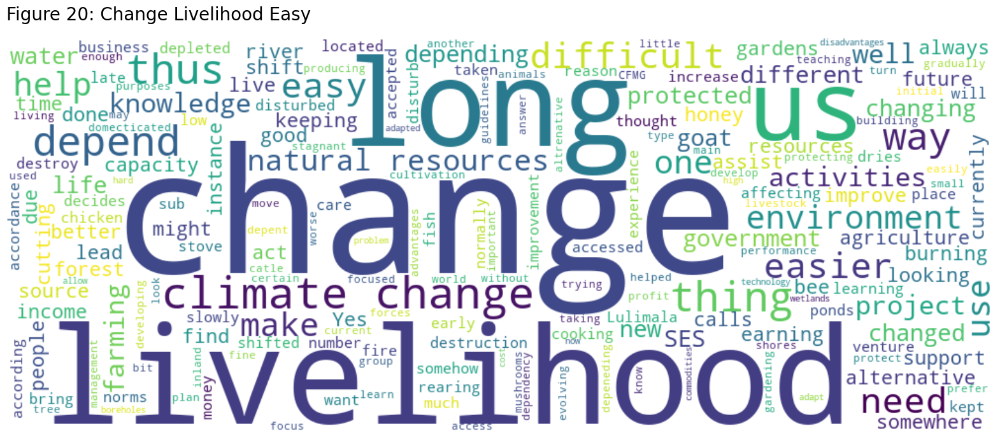

In [318]:
CLE_R1["Change_Livelihood_Easy_Reasons"] = CLE_R1["Change_Livelihood_Easy_Reasons"].fillna("")  
CLE_R1["Change_Livelihood_Easy_Reasons"] = CLE_R1["Change_Livelihood_Easy_Reasons"].astype(str)
CLE_R1_Text = " ".join(CLE_R1["Change_Livelihood_Easy_Reasons"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CLE_R1_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Change Livelihood Easy", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

In [319]:
agreement_levels = ["Disagree_Likert", "Strongly_Disagree_Likert"]
CLE_R2 = df2[df2["Change_Livelihood_Easy"].isin(agreement_levels)]
CLE_R3 = CLE_R2.drop(CLE_R2.columns[[0,1,2,3,4,6,7,8,9,10,11,12,13,14,15,16,17,18,19,22,23,24,25,26,27,28,29,30,31,32,33,34]], axis = 1)
CLE_R3grouped = CLE_R3.groupby('Name_Main_Project')['Change_Livelihood_Easy']
CLE_R3

,Name_Main_Project,Change_Livelihood_Easy,Change_Livelihood_Easy_Reasons
3,TRALARD_LNM,Strongly_Disagree_Likert,Because my livelihood would improve
10,TRALARD_LNM,Strongly_Disagree_Likert,"Because everything we use comes from natural resources like tree for building, animals for proteins"
16,TRALARD_LNM,Strongly_Disagree_Likert,It is a source of income
18,TRALARD_LNM,Strongly_Disagree_Likert,They can assist in having adequate water if trees are not cut as well as future general to see the natural resources
19,TRALARD_LNM,Disagree_Likert,The world is becoming mordenised thus we need to adapt to the current status
20,TRALARD_LNM,Disagree_Likert,Thats where some of our income comes from
23,EbA_CENTRAL_MUCHINGA_LUAPULA,Disagree_Likert,It is because we depend on natural resources thus changing is not easy
24,TRALARD_LNM,Disagree_Likert,I do not use natural resources
28,TRALARD_LNM,Strongly_Disagree_Likert,We depend on agriculture and not the natural resource like forest
31,TRALARD_LNM,Disagree_Likert,We mostly use goats and pigs in our livelihoods


In [320]:
lemmatizer=WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
for index, row in CLE_R3.iterrows():
    CLE_R3_filter_sentence = []
    CLE_R3_sentence = row["Change_Livelihood_Easy_Reasons"]
    if pd.isnull(CLE_R3_sentence):
       continue
    CLE_R3_sentence_cleaned = re.sub(r'[^\w\s]','',CLE_R3_sentence)
    CLE_R3_words = nltk.word_tokenize(CLE_R3_sentence_cleaned)
    CLE_R3_words = [lemmatizer.lemmatize(w) for w in CLE_R3_words if w.lower() not in stop_words]
    CLE_R3_filter_sentence.extend(CLE_R3_words)
    print(CLE_R3_filter_sentence)

['livelihood', 'would', 'improve']
['everything', 'use', 'come', 'natural', 'resource', 'like', 'tree', 'building', 'animal', 'protein']
['source', 'income']
['assist', 'adequate', 'water', 'tree', 'cut', 'well', 'future', 'general', 'see', 'natural', 'resource']
['world', 'becoming', 'mordenised', 'thus', 'need', 'adapt', 'current', 'status']
['Thats', 'income', 'come']
['depend', 'natural', 'resource', 'thus', 'changing', 'easy']
['use', 'natural', 'resource']
['depend', 'agriculture', 'natural', 'resource', 'like', 'forest']
['mostly', 'use', 'goat', 'pig', 'livelihood']
['livelihood', 'engage', 'keeping', 'goat', 'fish', 'farming']
['livelihood', 'like', 'keeping', 'goat', 'chicken', 'gardening', 'hiring', 'wedding', 'dress']
['use', 'domesticated', 'animal']
['use']
['thing', 'learning', 'already']
['money', 'protection', 'environment', 'yet', 'money', 'carbon', 'trade', 'waiting', 'long', 'time']
['used']
['changing', 'another', 'lifestyle', 'mean', 'starting', 'new', 'life']
['c

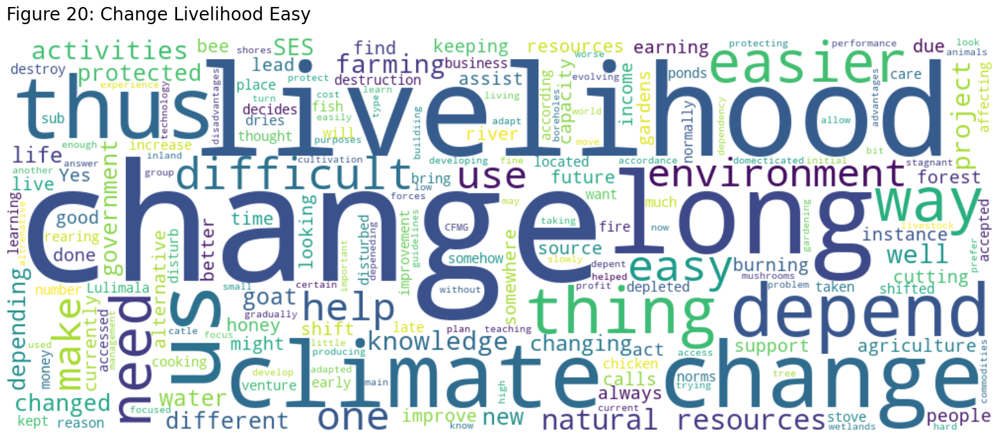

In [321]:
CLE_R3["Change_Livelihood_Easy_Reasons"] = CLE_R3["Change_Livelihood_Easy_Reasons"].fillna("")  
CLE_R3["Change_Livelihood_Easy_Reasons"] = CLE_R3["Change_Livelihood_Easy_Reasons"].astype(str)
CLE_R3_Text = " ".join(CLE_R1["Change_Livelihood_Easy_Reasons"])
wordcloud = WordCloud(background_color = "white", width = 1000, height = 400).generate(CLE_R3_Text)
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Figure 20: Change Livelihood Easy", loc="left", fontsize=20, pad=20)
plt.axis("off")  
plt.show()

### 11.8 Main Project and Ecosystem Service Reduction

In [322]:
ESR_grouped = df2.groupby('Name_Main_Project')['Ecosystem_Services_Reduced'].value_counts(dropna=False)

In [323]:
ESR_grouped1 = pd.DataFrame(ESR_grouped)

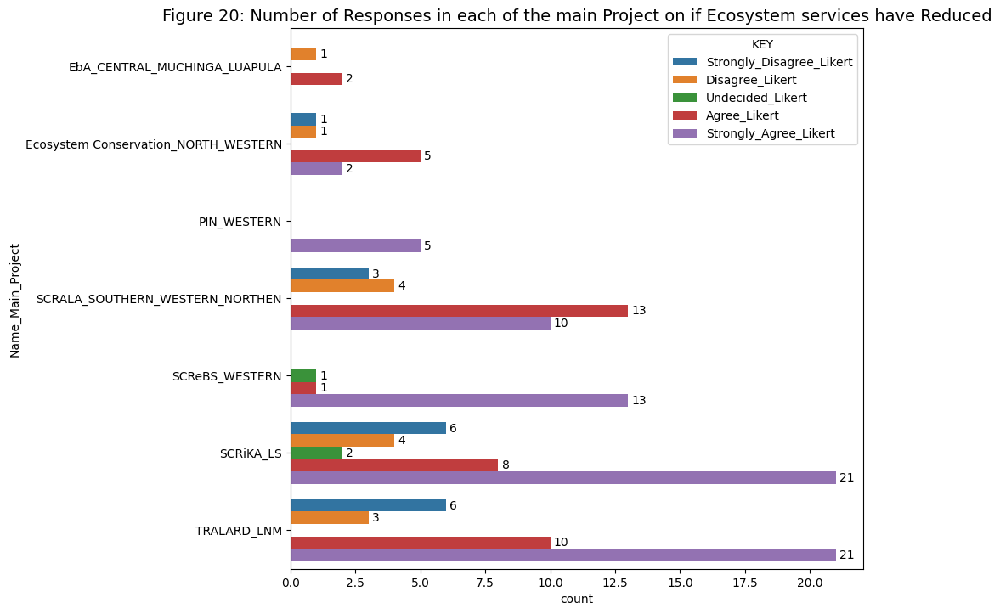

In [324]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = ESR_grouped1, x="count", y="Name_Main_Project", hue="Ecosystem_Services_Reduced", hue_order=hue_order, legend=True)
ax.set_title("Figure 20: Number of Responses in each of the main Project on if Ecosystem services have Reduced", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.9 Main project and Deforestation Increase

In [325]:
DI_grouped = df2.groupby('Name_Main_Project')['Deforestaion_Increased'].value_counts(dropna=False)

In [326]:
DI_grouped1 = pd.DataFrame(DI_grouped)

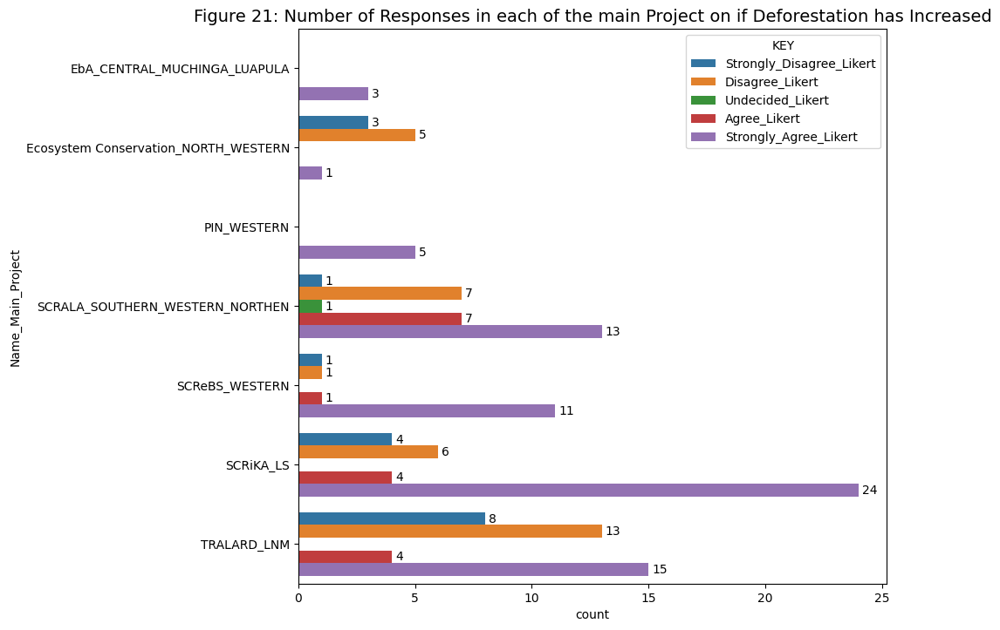

In [327]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = DI_grouped1, x="count", y="Name_Main_Project", hue="Deforestaion_Increased", hue_order=hue_order, legend=True)
ax.set_title("Figure 21: Number of Responses in each of the main Project on if Deforestation has Increased", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.10 Main project and Protected Areas as a Hinderance

In [328]:
PAHL_grouped = df2.groupby('Name_Main_Project')['Protected_Areas_Hinderarnce_Livelihood'].value_counts(dropna=False)

In [329]:
PAHL_grouped1 = pd.DataFrame(PAHL_grouped)

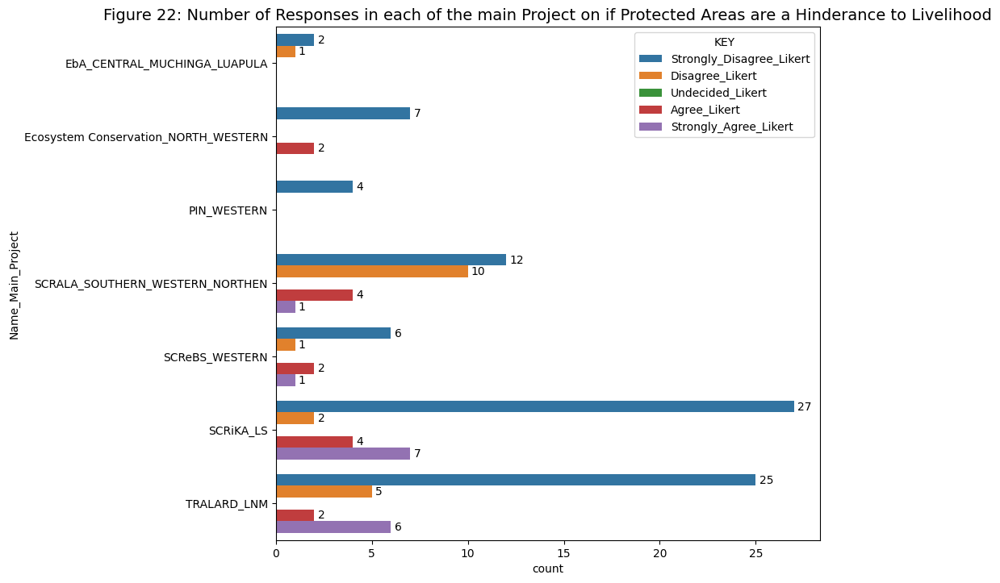

In [330]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = PAHL_grouped1, x="count", y="Name_Main_Project", hue="Protected_Areas_Hinderarnce_Livelihood", hue_order=hue_order, legend=True)
ax.set_title("Figure 22: Number of Responses in each of the main Project on if Protected Areas are a Hinderance to Livelihood", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.11 Main Project and New Livelihood Projects

In [331]:
NLP_grouped = df2.groupby('Name_Main_Project')['New_Livelihood_Projects'].value_counts(dropna=False)

In [332]:
NLP_grouped1 = pd.DataFrame(NLP_grouped)

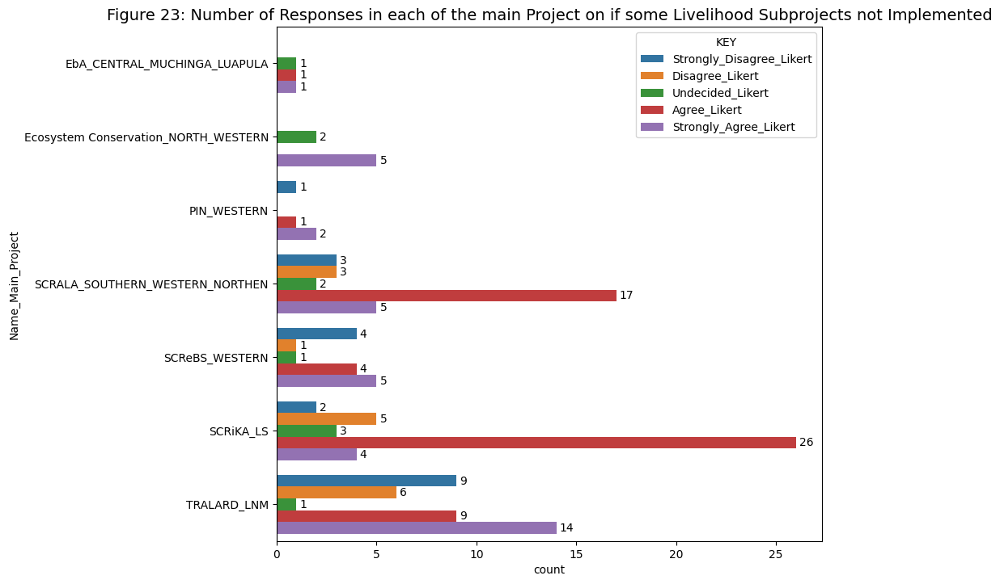

In [333]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = NLP_grouped1, x="count", y="Name_Main_Project", hue="New_Livelihood_Projects", hue_order=hue_order, legend=True)
ax.set_title("Figure 23: Number of Responses in each of the main Project on if some Livelihood Subprojects not Implemented", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

### 11.12 Main Project and Sustainability of Subprojects

In [334]:
SSC_grouped = df2.groupby('Name_Main_Project')['Subprojects_Sustainability_Contribution'].value_counts(dropna=False)

In [335]:
SSC_grouped1 = pd.DataFrame(SSC_grouped)

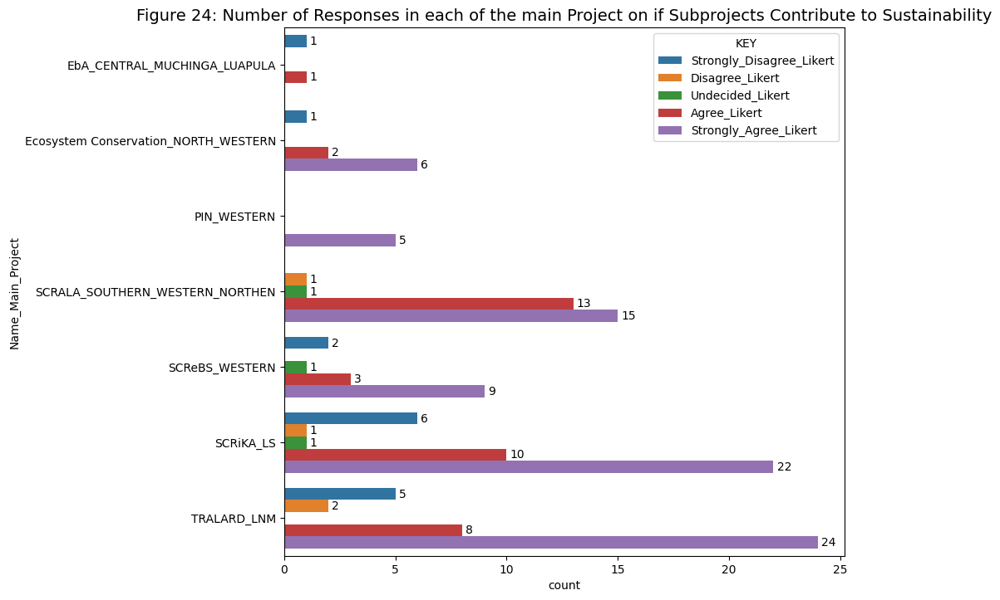

In [336]:
plt.figure(figsize=(8.7, 8.27))
hue_order = ["Strongly_Disagree_Likert", "Disagree_Likert", "Undecided_Likert", "Agree_Likert", "Strongly_Agree_Likert"]
ax = sns.barplot(data = SSC_grouped1, x="count", y="Name_Main_Project", hue="Subprojects_Sustainability_Contribution", hue_order=hue_order, legend=True)
ax.set_title("Figure 24: Number of Responses in each of the main Project on if Subprojects Contribute to Sustainability", fontsize=14)
plt.legend(title="KEY")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", label_type="edge", padding=3)
plt.show()

[<a href="#Purpose-of-the-Analysis">Back to top</a>]

## 12. Converting the Notebook

In [337]:
with open('02_Landscape_Transformation_Livelihood.ipynb', 'r') as f:
    notebook = nbformat.read(f, as_version=4)

# Initialize the HTML Exporter
html_exporter = HTMLExporter()
(body, resources) = html_exporter.from_notebook_node(notebook)

# Save the HTML output
with open('02_Landscape_Transformation_Livelihood.html', 'w') as f:
    f.write(body)

print("Conversion to HTML completed!")

Conversion to HTML completed!


[<a href="#Purpose-of-the-Analysis">Back to top</a>]